In [1]:
import astropy.units as u
from astropy.visualization import quantity_support
quantity_support()
import matplotlib.pyplot as plt
from matplotlib.colors import BoundaryNorm, LogNorm
from astropy.coordinates import SkyCoord
import astropy.constants as const

import numpy as np
import pandas as pd
import healpy as hp
import gala.dynamics as gd
import gala.units as gu

import cogsworth

Holoviews not imported. Some visualizations will not be available.
PyMultiNest not imported.  MultiNest fits will not work.


In [2]:
pd.set_option('display.max_columns', None)

In [3]:
%config InlineBackend.figure_format = 'retina'

plt.rc('font', family='serif')
plt.rcParams['text.usetex'] = False
fs = 24

# update various fontsizes to match
params = {'figure.figsize': (12, 8),
          'legend.fontsize': fs,
          'axes.labelsize': fs,
          'xtick.labelsize': 0.9 * fs,
          'ytick.labelsize': 0.9 * fs,
          'axes.linewidth': 1.1,
          'xtick.major.size': 7,
          'xtick.minor.size': 4,
          'ytick.major.size': 7,
          'ytick.minor.size': 4}
plt.rcParams.update(params)
plt.style.use("dark_background")

# Load data and precompute parameters

In [4]:
%%time
p_bin = cogsworth.pop.load("data/recent-pop-binaries")
p_sing = cogsworth.pop.load("data/recent-pop-singles")

CPU times: user 3min 8s, sys: 12.9 s, total: 3min 21s
Wall time: 3min 27s


In [5]:
%%time
p_bin.final_coords
p_sing.final_coords

CPU times: user 6min 43s, sys: 3.5 s, total: 6min 46s
Wall time: 6min 45s


(<SkyCoord (Galactocentric: galcen_coord=<ICRS Coordinate: (ra, dec) in deg
     (266.4051, -28.936175)>, galcen_distance=8.122 kpc, galcen_v_sun=(12.9, 245.6, 7.78) km / s, z_sun=20.8 pc, roll=0.0 deg): (x, y, z) in kpc
     [(-4.57522822, -17.4836211 ,  0.08440718),
      (-1.36255731,  -4.20840076,  0.0130997 ),
      (-0.28338142,  -7.69459273, -0.05517688), ...,
      ( 5.0443367 ,   1.63693298,  0.14606863),
      (-4.17365978,   5.92803048, -0.00668691),
      ( 7.11754249,   7.60586771,  0.90347915)]
  (v_x, v_y, v_z) in km / s
     [( 207.8902362 ,  -53.3998614 ,  -1.80339721),
      ( 217.31288236,  -72.33726553, -11.64092203),
      ( 229.90433783,   -6.11624759,  -2.4539163 ), ...,
      ( -70.77818247,  225.35213929,   3.14736306),
      (-188.64637328, -132.86384264,  11.03695906),
      (-160.37946773,  148.88144725,  30.34032029)]>,
 <SkyCoord (Galactocentric: galcen_coord=<ICRS Coordinate: (ra, dec) in deg
     (266.4051, -28.936175)>, galcen_distance=8.122 kpc, galcen

In [6]:
%%time
p_bin.observables
p_sing.observables

Loading pixel_info ...
Loading samples ...
Loading best_fit ...
Replacing NaNs in reliable distance estimates ...
Sorting pixel_info ...
Extracting hp_idx_sorted and data_idx at each nside ...
  nside = 64
  nside = 128
  nside = 256
  nside = 512
  nside = 1024
t = 18.884 s
  pix_info:   0.408 s
   samples:   7.263 s
      best:   3.471 s
       nan:   0.020 s
      sort:   7.654 s
       idx:   0.068 s
Loading pixel_info ...
Loading samples ...
Loading best_fit ...
Replacing NaNs in reliable distance estimates ...
Sorting pixel_info ...
Extracting hp_idx_sorted and data_idx at each nside ...
  nside = 64
  nside = 128
  nside = 256
  nside = 512
  nside = 1024
t = 20.904 s
  pix_info:   0.411 s
   samples:   7.177 s
      best:   4.029 s
       nan:   0.021 s
      sort:   9.201 s
       idx:   0.064 s


/home/tomwagg/anaconda3/envs/cosmic-gala/lib/python3.10/site-packages/astropy/units/quantity.py:611: RuntimeWarning: invalid value encountered in rxp
  result = super().__array_ufunc__(function, method, *arrays, **kwargs)
/home/tomwagg/Documents/cosmic-gala/cogsworth/observables.py:31: RuntimeWarning: invalid value encountered in log10
  return np.log10(g.cgs.value)
/home/tomwagg/anaconda3/envs/cosmic-gala/lib/python3.10/site-packages/astropy/units/quantity.py:611: RuntimeWarning: invalid value encountered in rxp
  result = super().__array_ufunc__(function, method, *arrays, **kwargs)


Loading pixel_info ...
Loading samples ...
Loading best_fit ...
Replacing NaNs in reliable distance estimates ...
Sorting pixel_info ...
Extracting hp_idx_sorted and data_idx at each nside ...
  nside = 64
  nside = 128
  nside = 256
  nside = 512
  nside = 1024
t = 22.359 s
  pix_info:   0.459 s
   samples:   8.277 s
      best:   4.155 s
       nan:   0.017 s
      sort:   9.381 s
       idx:   0.070 s
Loading pixel_info ...
Loading samples ...
Loading best_fit ...
Replacing NaNs in reliable distance estimates ...
Sorting pixel_info ...
Extracting hp_idx_sorted and data_idx at each nside ...
  nside = 64
  nside = 128
  nside = 256
  nside = 512
  nside = 1024
t = 21.025 s
  pix_info:   0.441 s
   samples:   7.838 s
      best:   3.828 s
       nan:   0.018 s
      sort:   8.833 s
       idx:   0.067 s
CPU times: user 1min 31s, sys: 8.89 s, total: 1min 40s
Wall time: 1min 42s


,Av_1,Av_2,M_abs_1,m_app_1,M_abs_2,m_app_2,J_app_1,J_app_2,J_abs_1,J_abs_2,H_app_1,H_app_2,H_abs_1,H_abs_2,K_app_1,K_app_2,K_abs_1,K_abs_2,G_app_1,G_app_2,teff_obs,log_g_obs,secondary_brighter,G_abs_1,G_abs_2,BP_app_1,BP_app_2,BP_abs_1,BP_abs_2,RP_app_1,RP_app_2,RP_abs_1,RP_abs_2
0,6.000000,6.0,10.545089,26.802046,25.014836,41.271793,26.808714,inf,10.551757,inf,25.484192,inf,9.227235,inf,24.880395,inf,8.623438,inf,31.236726,inf,3490.488375,5.078428,False,14.979769,inf,34.107631,inf,17.850674,inf,29.887334,inf,13.630377,inf
1,6.000000,6.0,9.127300,23.632530,NaN,NaN,23.564587,inf,9.059357,inf,22.284560,inf,7.779330,inf,21.700375,inf,7.195145,inf,28.105877,inf,3539.733832,5.221018,False,13.600647,inf,31.300450,inf,16.795220,inf,26.730903,inf,12.225673,inf
2,6.000000,6.0,11.065378,26.269250,23.798413,39.002286,26.043560,inf,10.839687,inf,24.738327,inf,9.534454,inf,24.132191,inf,8.928319,inf,30.931082,inf,3089.229828,5.359598,False,15.727210,inf,34.885953,inf,19.682080,inf,29.516441,inf,14.312568,inf
3,5.072700,6.0,10.765057,26.300991,NaN,NaN,25.806406,inf,10.270472,inf,24.657659,inf,9.121725,inf,24.105204,inf,8.569271,inf,30.509994,inf,3111.238223,4.681477,False,14.974060,inf,34.162494,inf,18.626560,inf,29.111637,inf,13.575703,inf
4,6.000000,6.0,7.699148,22.186512,NaN,NaN,22.273339,inf,7.785976,inf,20.849032,inf,6.361668,inf,20.324245,inf,5.836882,inf,26.620238,inf,3965.829799,4.072249,False,12.132875,inf,29.290444,inf,14.803080,inf,25.288160,inf,10.800796,inf
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1323710,6.000000,6.0,6.419200,22.839240,24.944093,41.364133,23.189709,inf,6.769668,inf,21.993575,inf,5.573535,inf,21.535722,inf,5.115682,inf,27.136711,inf,4793.049685,4.012155,False,10.716671,inf,29.265908,inf,12.845868,inf,25.869907,inf,9.449867,inf
1323711,6.000000,6.0,9.420522,23.055546,20.925638,34.560662,22.985623,inf,9.350599,inf,21.673554,inf,8.038530,inf,21.090304,inf,7.455280,inf,27.558424,inf,3512.131232,4.689871,False,13.923400,inf,30.791226,inf,17.156202,inf,26.180901,inf,12.545877,inf
1323712,4.768683,6.0,9.490525,25.104597,NaN,NaN,24.656446,inf,9.042375,inf,23.461766,inf,7.847694,inf,22.959565,inf,7.345494,inf,28.959221,inf,3473.401156,4.514055,False,13.345150,inf,31.902758,inf,16.288686,inf,27.606900,inf,11.992829,inf
1323713,4.387200,6.0,8.501160,22.764354,23.430051,37.693245,22.322033,inf,8.058839,inf,21.197497,inf,6.934303,inf,20.721721,inf,6.458527,inf,26.231513,inf,3706.166557,5.021878,False,11.968319,inf,28.561656,inf,14.298462,inf,24.941551,inf,10.678357,inf


# Stellar type labels and colours

In [217]:
stellar_types = [
    None,
    {"long": "Main Sequence", "short": "MS", "colour": None},
    {"long": "Hertzsprung Gap", "short": "HG", "colour": None},
    {"long": "First Giant Branch", "short": "FGB", "colour": None},
    {"long": "Core Helium Burning", "short": "CHeB", "colour": None},
    {"long": "Early Asymptotic Giant Branch", "short": "EAGB", "colour": None},
    {"long": "Thermally Pulsing Asymptotic Giant Branch", "short": "TPAGB", "colour": None},
    {"long": "Helium Main Sequence", "short": "HeMS", "colour": None},
    {"long": "Helium Hertsprung Gap", "short": "HeHG", "colour": None},
    {"long": "Helium Giant Branch", "short": "HeGB", "colour": None},
    {"long": "Helium White Dwarf", "short": "HeWD", "colour": None},
    {"long": "Carbon/Oxygen White Dwarf", "short": "COWD", "colour": None},
    {"long": "Oxygen/Neon White Dwarf", "short": "ONeWD", "colour": None},
    {"long": "Neutron Star", "short": "NS", "colour": "grey"},
    {"long": "Black Hole", "short": "BH", "colour": "black"},
    {"long": "Massless Remnant", "short": "MR", "colour": "yellow"},
    {"long": "Chemically Homogeneous", "short": "CHE", "colour": "brown"}
]

for i in [1, 2]:
    stellar_types[i]["colour"] = plt.get_cmap("YlOrBr")(0.3 * i)

for i in [3, 4]:
    stellar_types[i]["colour"] = plt.get_cmap("Blues")(0.3 * (i - 2))

for i in [5, 6]:
    stellar_types[i]["colour"] = plt.get_cmap("Greens")(0.3 * (3 - (i - 4)))

for i in [7, 8, 9]:
    stellar_types[i]["colour"] = plt.get_cmap("plasma")(0.1 + 0.2 * (i - 7))

for i in [10, 11, 12]:
    stellar_types[i]["colour"] = plt.get_cmap("copper")(0.1 + 0.2 * (i - 9))

# Plots for meeting

## Prep the data

In [222]:
def get_mag_combined(p, filter, mag_type):
    return np.concatenate((p.observables[f"{filter}_{mag_type}_1"],
                           p.observables[f"{filter}_{mag_type}_2"][p.disrupted]))

In [223]:
def get_binary_prop_combined(p, prop):
    return np.concatenate((np.where(p.observables["secondary_brighter"],
                           p.final_bpp[f"{prop}_2"], p.final_bpp[f"{prop}_1"]),
                           p.final_bpp[f"{prop}_2"][p.disrupted]))

## Binaries

In [430]:
distances = np.concatenate((p_bin.final_coords[0].icrs.distance, p_bin.final_coords[1][p_bin.disrupted].icrs.distance))
z = np.concatenate((p_bin.final_coords[0].z, p_bin.final_coords[1][p_bin.disrupted].z))
G_app = get_mag_combined(p_bin, "G", "app")
G_abs = get_mag_combined(p_bin, "G", "abs")
G_BP_app = get_mag_combined(p_bin, "BP", "app")
G_RP_app = get_mag_combined(p_bin, "RP", "app")
mass = get_binary_prop_combined(p_bin, "mass")
lum = get_binary_prop_combined(p_bin, "lum")
teff = get_binary_prop_combined(p_bin, "teff")
kstar = get_binary_prop_combined(p_bin, "kstar").astype(int)

kstar[kstar == 0] = 1
unique_kstars = np.unique(kstar)

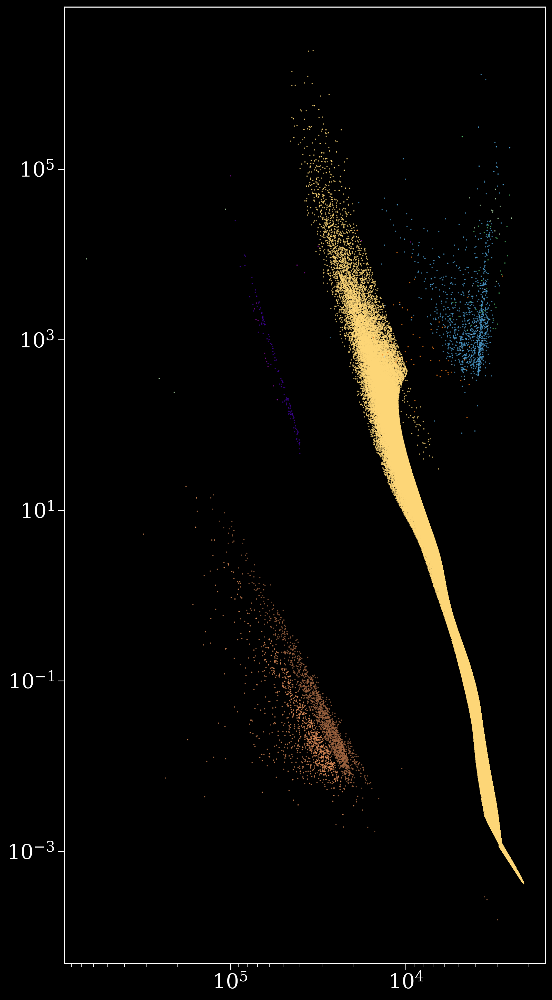

In [225]:
fig, ax = plt.subplots(figsize=(9, 18))

for stellar_type in unique_kstars:
    if stellar_type not in [13, 14, 15]:
        matching_kstar = kstar == stellar_type
        ax.scatter(teff[matching_kstar], lum[matching_kstar], s=0.1, color=stellar_types[stellar_type]["colour"])

ax.invert_xaxis()

# stellar_type_range = range(1, 14)
# for i, st in enumerate(stellar_type_range):
#     ax.annotate(stellar_types[st]["short"], xy=(0.98, 0.2 + 0.02 * (len(stellar_type_range) - 0.5 - i)),
#                 xycoords="axes fraction", color=stellar_types[st]["colour"], fontsize=0.7*fs, ha="right")

plt.xscale("log")
plt.yscale("log")
plt.show()

### Gaia CMD

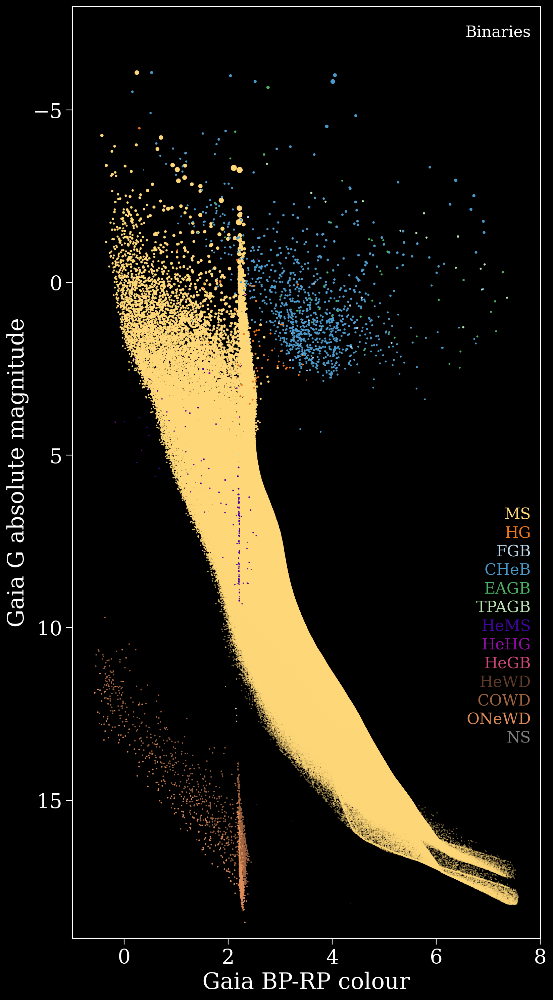

In [432]:
fig, ax = plt.subplots(figsize=(9, 18))

with np.errstate(invalid='ignore'):
    colour = G_BP_app - G_RP_app

for stellar_type in unique_kstars:
    matching_kstar = kstar == stellar_type
    ax.scatter(colour[matching_kstar], G_abs[matching_kstar], s=0.3 * mass[matching_kstar],
               color=stellar_types[stellar_type]["colour"])

ax.set_ylim(reversed(ax.get_ylim()))

ax.set_xlabel("Gaia BP-RP colour")
ax.set_ylabel("Gaia G absolute magnitude")

stellar_type_range = np.arange(1, 14)
for i, st in enumerate(stellar_type_range):
    ax.annotate(stellar_types[st]["short"], xy=(0.98, 0.2 + 0.02 * (len(stellar_type_range) - 0.5 - i)),
                xycoords="axes fraction", color=stellar_types[st]["colour"], fontsize=0.7*fs, ha="right")
    
ax.annotate("Binaries", xy=(0.98, 0.98), ha="right", va="top", xycoords="axes fraction", fontsize=0.7*fs)

ax.set_xlim(-1, 8)
ax.set_ylim(19, -8)
    
plt.show()

### Distance vs. Apparent Magnitude

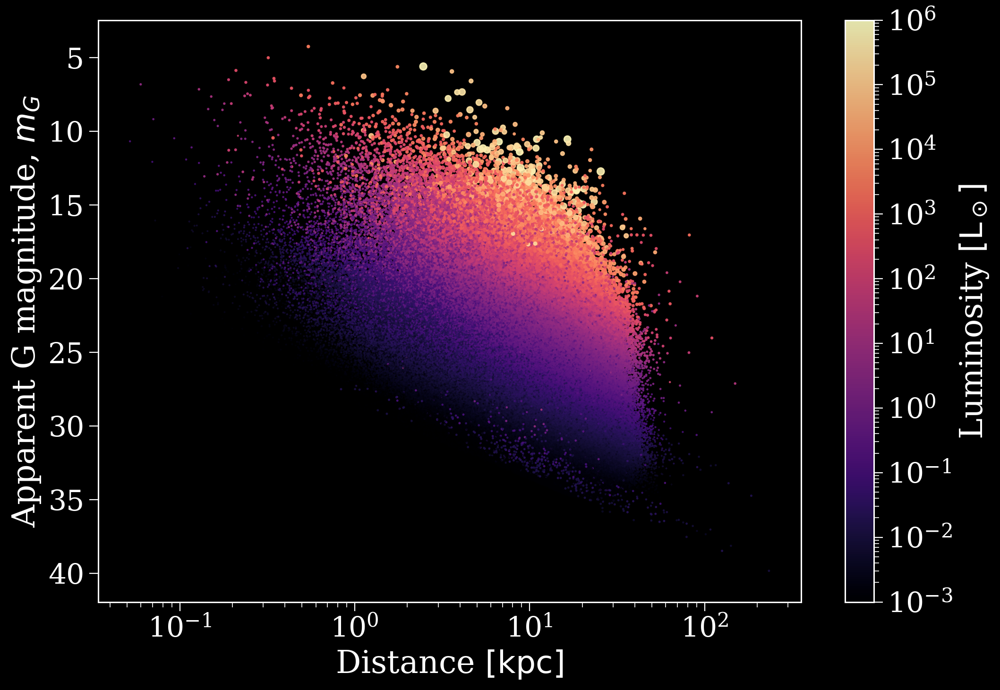

In [16]:
fig, ax = plt.subplots()

scatter = ax.scatter(distances, G_app, s=0.5 * mass, alpha=0.9,
                     c=lum, norm=LogNorm(vmin=1e-3, vmax=1e6), cmap="magma")

cbar = fig.colorbar(scatter, label=r"Luminosity $[\rm L_\odot]$")

ax.set_xlabel(r"Distance $[\rm kpc]$")
ax.set_ylabel(r"Apparent G magnitude, $m_G$")
ax.set_xscale("log")
ax.set_ylim(reversed(ax.get_ylim()))

plt.show()

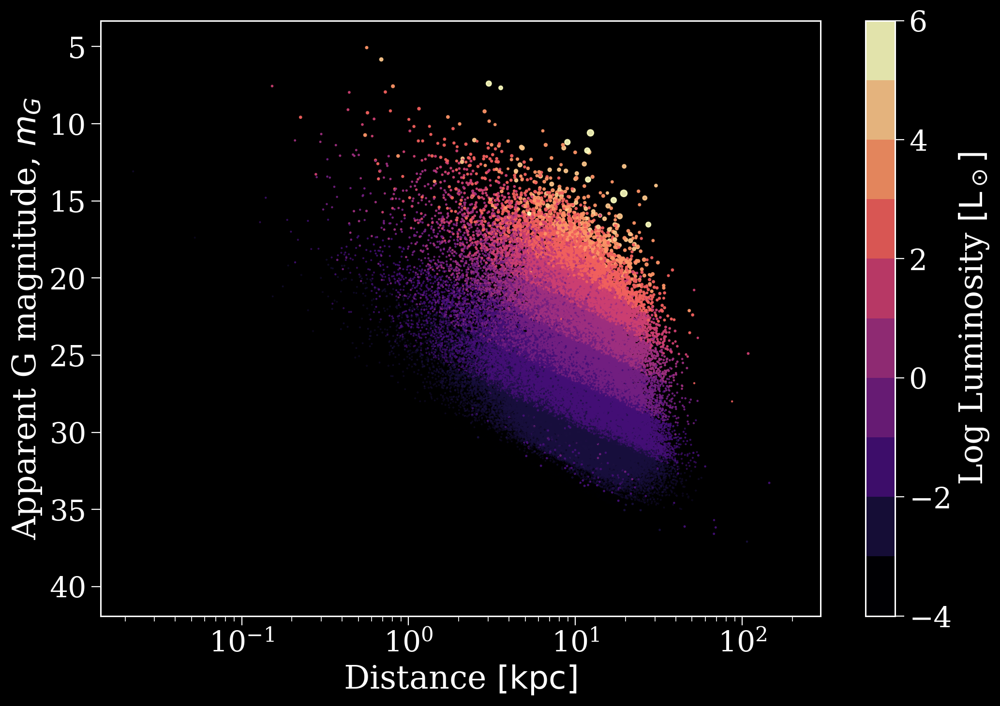

In [122]:
fig, ax = plt.subplots()

boundaries = [-4, -2, 0, 2, 4, 6]
boundaries = np.linspace(-4, 6, 11)

scatter = ax.scatter(distances, G_app, s=0.5 * mass, alpha=0.9,
                     c=np.log10(lum), norm=BoundaryNorm(boundaries=boundaries, ncolors=256), cmap="magma")

cbar = fig.colorbar(scatter, label=r"Log Luminosity $[\rm L_\odot]$")

ax.set_xlabel(r"Distance $[\rm kpc]$")
ax.set_ylabel(r"Apparent G magnitude, $m_G$")
ax.set_xscale("log")
ax.set_ylim(reversed(ax.get_ylim()))

plt.show()

## Singles

In [426]:
distances = p_sing.final_coords[0].icrs.distance
G_app = get_mag_combined(p_sing, "G", "app")
G_abs = get_mag_combined(p_sing, "G", "abs")
G_BP_app = get_mag_combined(p_sing, "BP", "app")
G_RP_app = get_mag_combined(p_sing, "RP", "app")
mass = get_binary_prop_combined(p_sing, "mass")
lum = get_binary_prop_combined(p_sing, "lum")
kstar = get_binary_prop_combined(p_sing, "kstar").astype(int)

kstar[kstar == 0] = 1
unique_kstars = np.unique(kstar)

### Gaia CMD

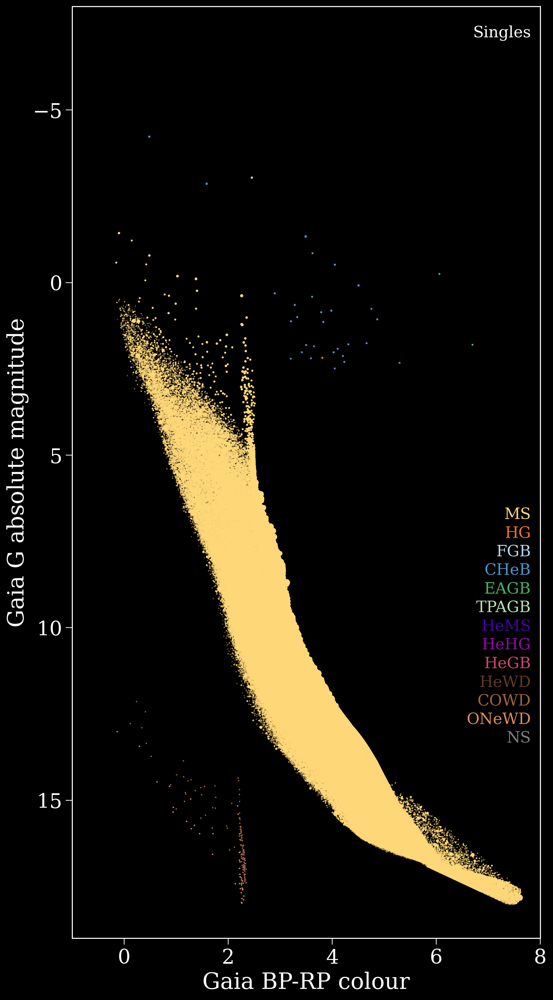

In [429]:
fig, ax = plt.subplots(figsize=(9, 18))

with np.errstate(invalid='ignore'):
    colour = G_BP_app - G_RP_app

for stellar_type in unique_kstars:
    matching_kstar = kstar == stellar_type
    ax.scatter(colour[matching_kstar], G_abs[matching_kstar], s=0.3 * mass[matching_kstar],
               color=stellar_types[stellar_type]["colour"])

ax.set_ylim(reversed(ax.get_ylim()))

ax.set_xlabel("Gaia BP-RP colour")
ax.set_ylabel("Gaia G absolute magnitude")

stellar_type_range = np.arange(1, 14)
for i, st in enumerate(stellar_type_range):
    ax.annotate(stellar_types[st]["short"], xy=(0.98, 0.2 + 0.02 * (len(stellar_type_range) - 0.5 - i)),
                xycoords="axes fraction", color=stellar_types[st]["colour"], fontsize=0.7*fs, ha="right")
    
ax.annotate("Singles", xy=(0.98, 0.98), ha="right", va="top", xycoords="axes fraction", fontsize=0.7*fs)

ax.set_xlim(-1, 8)
ax.set_ylim(19, -8)
    
plt.show()

### Galactic Height

In [60]:
p_sing.final_bpp[p_sing.final_coords[0].z > 10**(0.5) * u.kpc]

,tphys,mass_1,mass_2,kstar_1,kstar_2,sep,porb,ecc,RRLO_1,RRLO_2,evol_type,aj_1,aj_2,tms_1,tms_2,massc_1,massc_2,rad_1,rad_2,mass0_1,mass0_2,lum_1,lum_2,teff_1,teff_2,radc_1,radc_2,menv_1,menv_2,renv_1,renv_2,omega_spin_1,omega_spin_2,B_1,B_2,bacc_1,bacc_2,tacc_1,tacc_2,epoch_1,epoch_2,bhspin_1,bhspin_2,bin_num,metallicity,log_g_1,log_g_2
16875,57.960203,1.277584,0.0,13.0,0.0,0.0,0.0,-1.0,0.0001,2.895251e-11,10.0,32.403123,0.0,1.000000e+10,3.754737e+08,1.277584,0.0,0.000014,0.289525,9.972688,0.0,2.244590e-05,7.543175e-08,106657.123815,178.572684,0.000014,0.0,1.000000e-10,0.005,1.000000e-10,0.188191,3.258705e+06,4.591936e-13,5.084685e+13,0.0,0.0,0.0,0.0,0.0,25.557080,0.0,0.0,0.0,16875,0.020533,14.252201,-inf
30265,126.788593,3.663639,0.0,14.0,0.0,0.0,0.0,-1.0,0.0001,2.825900e-11,10.0,121.927717,0.0,1.000000e+10,3.820850e+08,3.663639,0.0,0.000016,0.282590,8.372840,0.0,1.000000e-10,NaN,4651.899649,NaN,0.000016,0.0,1.000000e-10,0.005,1.000000e-10,0.183683,2.000000e+08,4.704629e-13,0.000000e+00,0.0,0.0,0.0,0.0,0.0,4.860877,0.0,0.0,0.0,30265,0.028709,14.619423,-inf
40841,131.577800,1.277584,0.0,13.0,0.0,0.0,0.0,-1.0,0.0001,2.815014e-11,10.0,101.173203,0.0,1.000000e+10,3.828301e+08,1.277584,0.0,0.000014,0.281501,8.923401,0.0,2.302395e-06,NaN,60360.183401,NaN,0.000014,0.0,1.000000e-10,0.005,1.000000e-10,0.182976,6.035983e+07,4.722822e-13,1.533727e+12,0.0,0.0,0.0,0.0,0.0,30.404596,0.0,0.0,0.0,40841,0.030000,14.252201,-inf
46582,88.629361,1.242000,0.0,13.0,0.0,0.0,0.0,-1.0,0.0001,2.891970e-11,10.0,49.168590,0.0,1.000000e+10,3.758867e+08,1.242000,0.0,0.000014,0.289197,1.434537,0.0,9.565682e-06,9.616118e-08,86175.652586,189.855284,0.000014,0.0,1.000000e-10,0.005,1.000000e-10,0.187978,1.966062e+07,4.597147e-13,6.818725e+12,0.0,0.0,0.0,0.0,0.0,39.460771,0.0,0.0,0.0,46582,0.020918,14.239933,-inf
69609,43.292638,1.277584,0.0,13.0,0.0,0.0,0.0,-1.0,0.0001,2.884825e-11,10.0,24.442574,0.0,1.000000e+10,3.767418e+08,1.277584,0.0,0.000014,0.288482,11.678627,0.0,3.944727e-05,2.338824e-07,122803.242670,237.388281,0.000014,0.0,1.000000e-10,0.005,1.000000e-10,0.187514,9.710493e+06,4.608533e-13,1.969997e+13,0.0,0.0,0.0,0.0,0.0,18.850065,0.0,0.0,0.0,69609,0.021758,14.252201,-inf
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1227386,63.401111,1.277584,0.0,13.0,0.0,0.0,0.0,-1.0,0.0001,2.974961e-11,10.0,36.543804,0.0,1.000000e+10,3.585693e+08,1.277584,0.0,0.000014,0.297496,10.069102,0.0,1.764751e-05,1.159506e-08,100432.997461,110.305524,0.000014,0.0,1.000000e-10,0.005,1.000000e-10,0.193372,9.634010e+06,4.468902e-13,1.621155e+13,0.0,0.0,0.0,0.0,0.0,26.857307,0.0,0.0,0.0,1227386,0.011232,14.252201,-inf
1237670,178.370222,1.802414,0.0,13.0,0.0,0.0,0.0,-1.0,0.0001,2.887340e-11,10.0,166.208945,0.0,1.000000e+10,3.764473e+08,1.802414,0.0,0.000014,0.288734,15.411800,0.0,1.074345e-06,1.558628e-07,49887.477224,214.390858,0.000014,0.0,1.000000e-10,0.005,1.000000e-10,0.187677,3.513158e+07,4.604517e-13,2.027338e+12,0.0,0.0,0.0,0.0,0.0,12.161278,0.0,0.0,0.0,1237670,0.021462,14.401666,-inf
1243178,110.385706,1.581026,0.0,13.0,0.0,0.0,0.0,-1.0,0.0001,2.911181e-11,10.0,96.462907,0.0,1.000000e+10,3.732620e+08,1.581026,0.0,0.000014,0.291118,14.347733,0.0,2.921450e-06,3.638720e-08,64062.696435,148.413072,0.000014,0.0,1.000000e-10,0.005,1.000000e-10,0.189227,5.611810e+07,4.566809e-13,1.689271e+12,0.0,0.0,0.0,0.0,0.0,13.922799,0.0,0.0,0.0,1243178,0.018666,14.344751,-inf
1243702,142.466722,1.277584,0.0,13.0,0.0,0.0,0.0,-1.0,0.0001,2.839423e-11,10.0,108.326421,0.0,1.000000e+10,3.810728e+08,1.277584,0.0,0.000014,0.283942,8.516500,0.0,2.008362e-06,NaN,58333.240610,NaN,0.000014,0.0,1.000000e-10,0.005,1.000000e-10,0.184562,4.167993e+07,4.682222e-13,2.155502e+12,0.0,0.0,0.0,0.0,0.0,34.140301,0.0,0.0,0.0,1243702,0.027109,14.252201,-inf


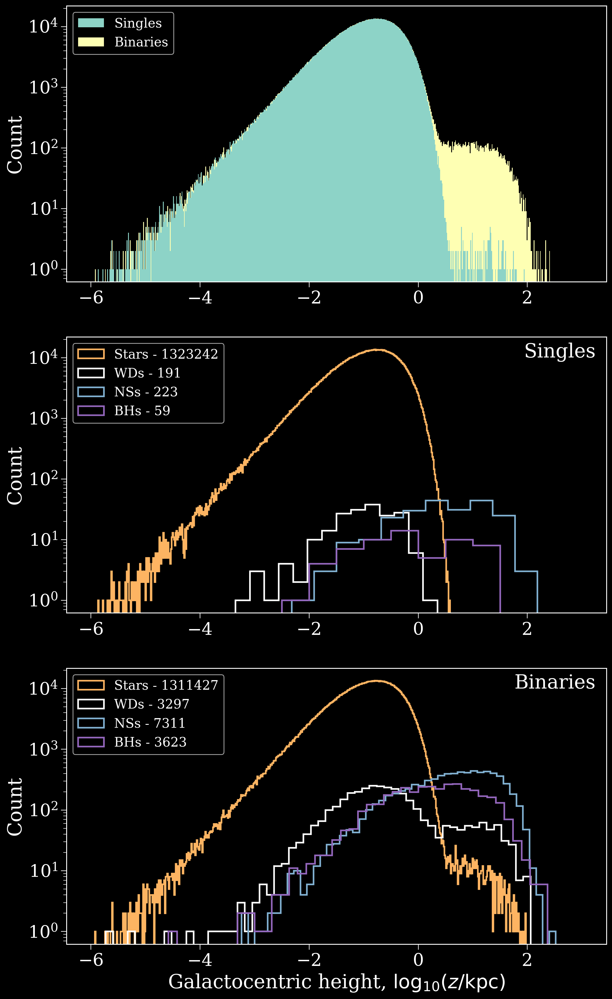

In [418]:
masks = [(0, 10), (10, 13), (13, 14), (14, 15)]
labels = ["Stars", "WDs", "NSs", "BHs"]
colours = ["C5", "white", "C4", "tab:purple"]

fig, axes = plt.subplots(3, 1, figsize=(12, 21))

range = (-6, 3)

axes[0].hist(np.log10(np.abs((p_sing.final_coords[0].z.value))), bins="fd", log=True,
             label="Singles", range=range)
axes[0].hist(np.log10(np.abs(z.value[np.isfinite(z.value)])), bins="fd", log=True,
             label="Binaries", range=range, zorder=-1)

for lims, label, colour in zip(masks, labels, colours):
    low, high = lims

    single_mask = (p_sing.final_bpp["kstar_1"] >= low) & (p_sing.final_bpp["kstar_1"] < high)
    axes[1].hist(np.log10(np.abs((p_sing.final_coords[0].z.value[single_mask]))), bins="auto", log=True,
                 label=f"{label} - {single_mask.sum()}", histtype="step", lw=2, range=range, color=colour)

    binary_mask = (kstar >= low) & (kstar < high)
    axes[2].hist(np.log10(np.abs(z.value[np.isfinite(z.value)][binary_mask])), bins="auto", log=True,
                 label=f"{label} - {binary_mask.sum()}", histtype="step", lw=2, range=range, color=colour)
    
axes[1].annotate("Singles", xy=(0.98, 0.98), xycoords="axes fraction", ha="right", va="top", fontsize=fs)
axes[2].annotate("Binaries", xy=(0.98, 0.98), xycoords="axes fraction", ha="right", va="top", fontsize=fs)
    
for ax in axes:
    ax.legend(loc="upper left", fontsize=16)
    ax.set_ylabel("Count")

axes[-1].set_xlabel(r"Galactocentric height, $\log_{10}(z / {\rm kpc})$")

plt.show()

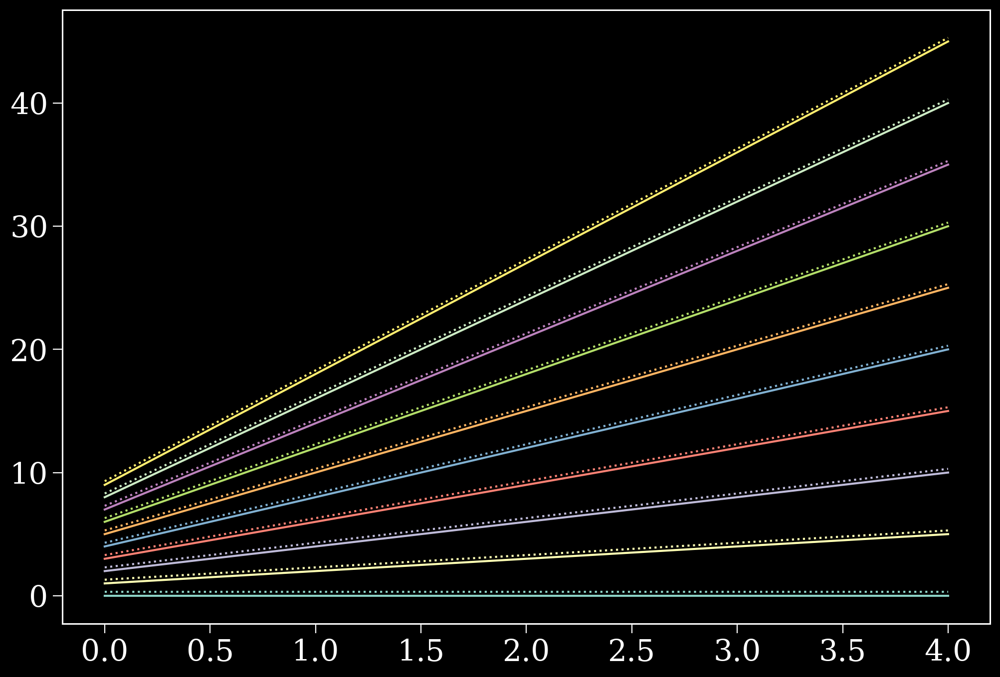

In [420]:
import numpy as np
import matplotlib.pyplot as plt

fig = plt.figure()
ax = fig.add_subplot(111)

t = np.arange(5)

for i in np.arange(10):
    line, = ax.plot(t,i*(t+1), linestyle = '-')
    ax.plot(t,i*(t+1)+.3,color = line.get_color(), linestyle = ':')

plt.show()

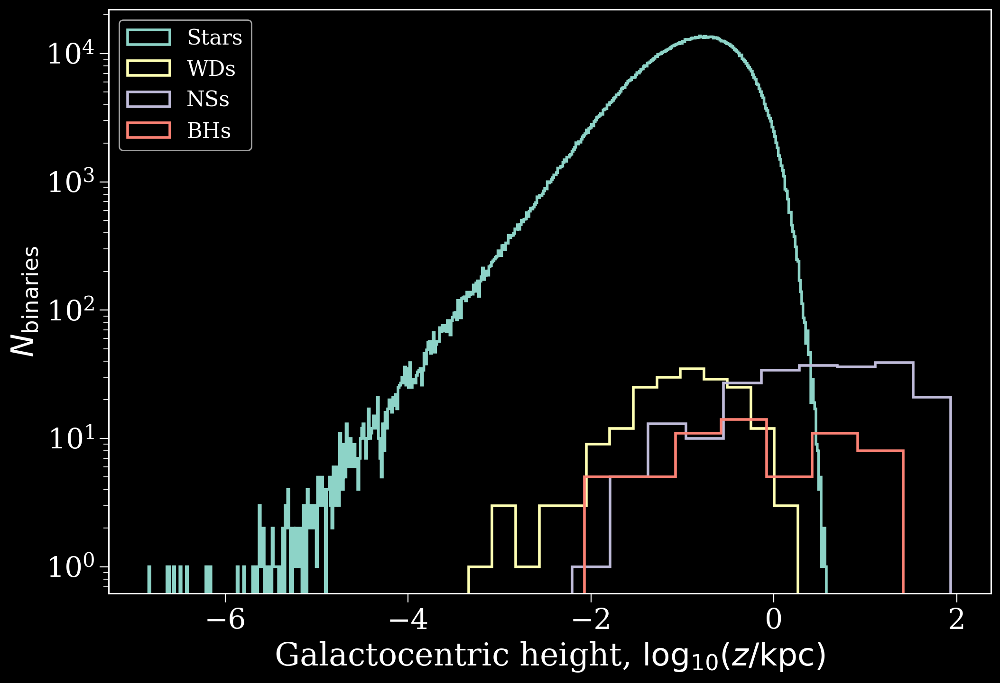

In [388]:
masks = [(0, 10), (10, 13), (13, 14), (14, 15)]
labels = ["Stars", "WDs", "NSs", "BHs"]

fig, ax = plt.subplots()

for lims, label in zip(masks, labels):
    low, high = lims
    single_mask = (p_sing.final_bpp["kstar_1"] >= low) & (p_sing.final_bpp["kstar_1"] < high)
    ax.hist(np.log10(np.abs((p_sing.final_coords[0].z.value[single_mask]))), bins="auto", log=True,
            label=label, histtype="step", lw=2)
plt.legend(loc="upper left", fontsize=16)
plt.xlabel(r"Galactocentric height, $\log_{10}(z / {\rm kpc})$")
plt.ylabel(r"$N_{\rm binaries}$")
plt.show()

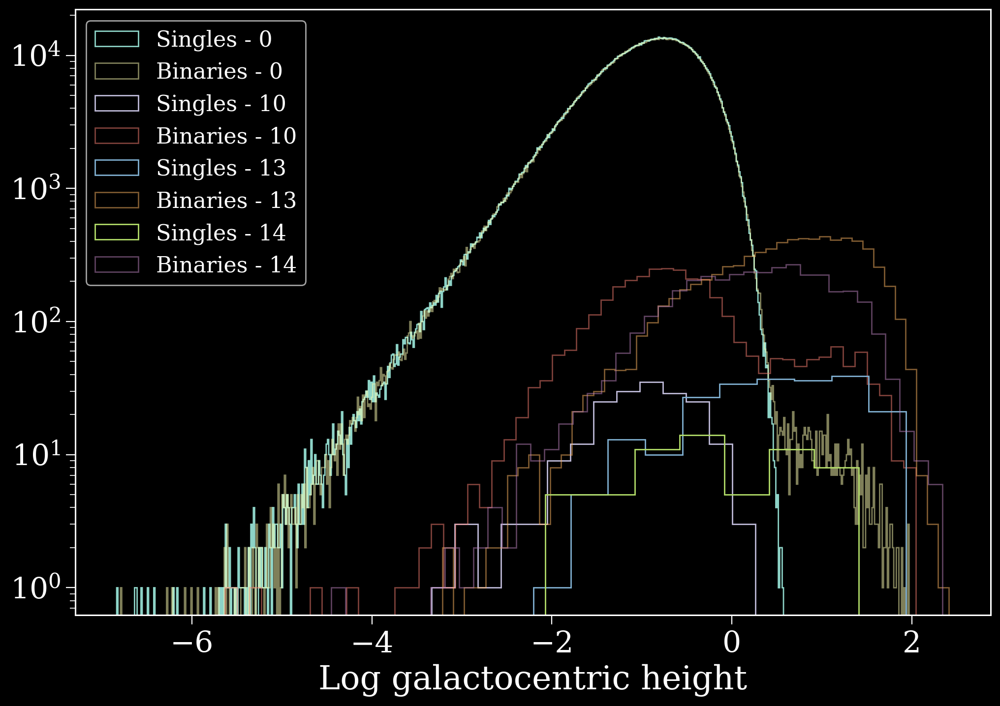

In [373]:
masks = [(0, 10), (10, 13), (13, 14), (14, 15)]

for low, high in masks:
    single_mask = (p_sing.final_bpp["kstar_1"] >= low) & (p_sing.final_bpp["kstar_1"] < high)
    binary_mask = (kstar >= low) & (kstar < high)
    plt.hist(np.log10(np.abs((p_sing.final_coords[0].z.value[single_mask]))), bins="auto", log=True, label=f"Singles - {low}", histtype="step");
    plt.hist(np.log10(np.abs(z.value[np.isfinite(z.value)][binary_mask])), bins="auto", alpha=0.5, log=True, label=f"Binaries - {low}", histtype="step");
plt.legend(loc="upper left", fontsize=16);
plt.xlabel("Log galactocentric height")
plt.show()

In [84]:
p_bin.mass_binaries

1812122.7956996243

In [86]:
104*1.8*200

37440.0

In [81]:
p_bin.classes.astype(int).sum()

dco                     164
co-1                   6453
co-2                   4570
xrb                     104
walkaway-t-1              0
walkaway-t-2            329
runaway-t-1               0
runaway-t-2             944
walkaway-o-1              0
walkaway-o-2              1
runaway-o-1               0
runaway-o-2            1272
widow-1                   0
widow-2                1377
stellar-merger-co-1    2096
stellar-merger-co-2    3376
pisn-1                   17
pisn-2                    5
dtype: int64

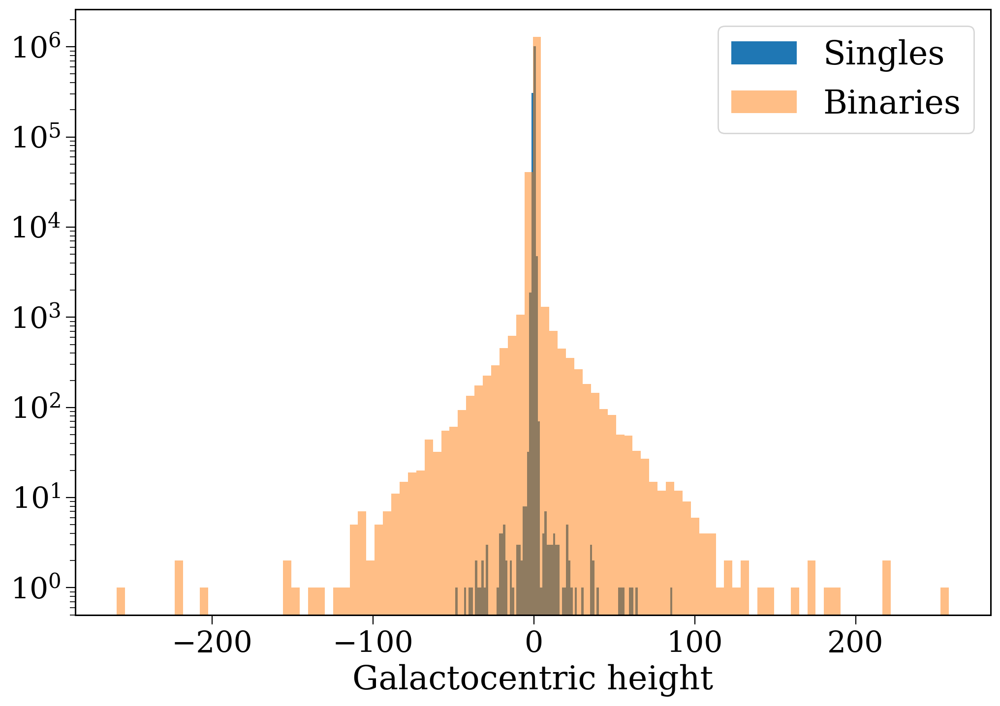

In [62]:
plt.hist(p_sing.final_coords[0].z.value, bins=100, log=True, label="Singles");
plt.hist(z.value[np.isfinite(z.value)], bins=100, alpha=0.5, log=True, label="Binaries");
plt.legend();
plt.xlabel("Galactocentric height")
plt.show()

In [56]:
p_bin.classes

,dco,co-1,co-2,xrb,walkaway-t-1,walkaway-t-2,runaway-t-1,runaway-t-2,walkaway-o-1,walkaway-o-2,runaway-o-1,runaway-o-2,widow-1,widow-2,stellar-merger-co-1,stellar-merger-co-2,pisn-1,pisn-2
0,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1323126,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
1323127,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
1323128,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
1323129,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False


### Distance vs. Apparent Magnitude

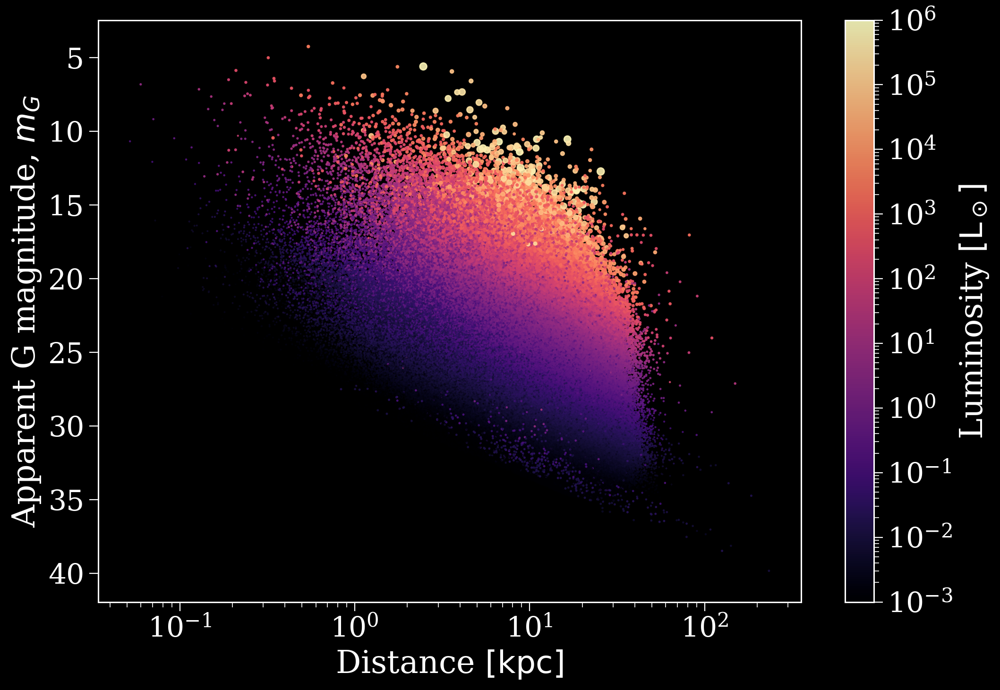

In [16]:
fig, ax = plt.subplots()

scatter = ax.scatter(distances, G_app, s=0.5 * mass, alpha=0.9,
                     c=lum, norm=LogNorm(vmin=1e-3, vmax=1e6), cmap="magma")

cbar = fig.colorbar(scatter, label=r"Luminosity $[\rm L_\odot]$")

ax.set_xlabel(r"Distance $[\rm kpc]$")
ax.set_ylabel(r"Apparent G magnitude, $m_G$")
ax.set_xscale("log")
ax.set_ylim(reversed(ax.get_ylim()))

plt.show()

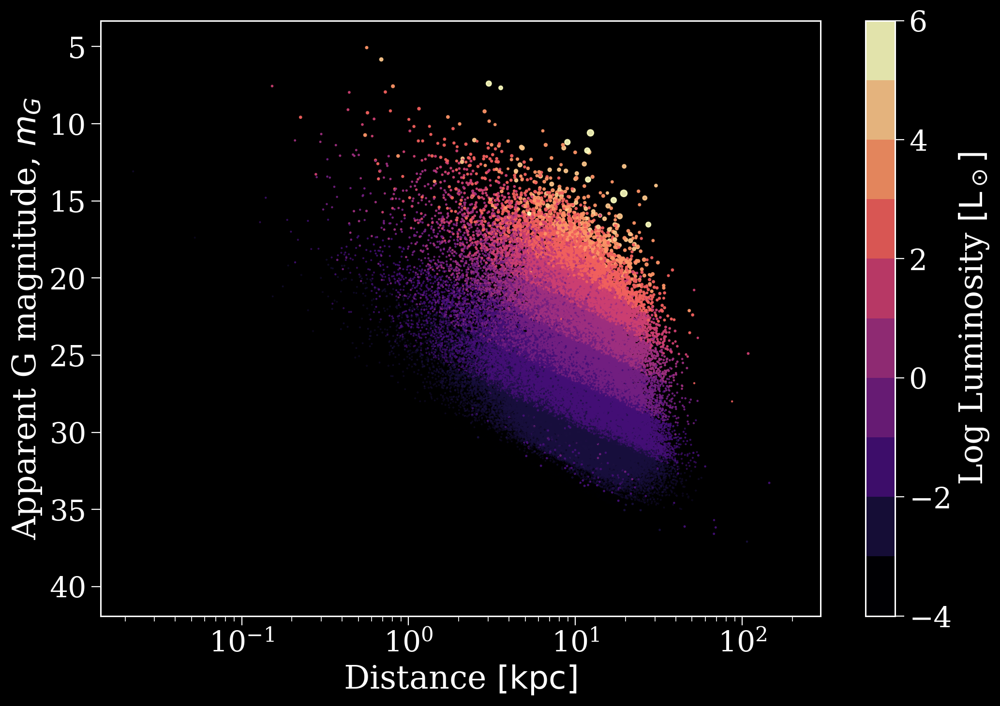

In [122]:
fig, ax = plt.subplots()

boundaries = [-4, -2, 0, 2, 4, 6]
boundaries = np.linspace(-4, 6, 11)

scatter = ax.scatter(distances, G_app, s=0.5 * mass, alpha=0.9,
                     c=np.log10(lum), norm=BoundaryNorm(boundaries=boundaries, ncolors=256), cmap="magma")

cbar = fig.colorbar(scatter, label=r"Log Luminosity $[\rm L_\odot]$")

ax.set_xlabel(r"Distance $[\rm kpc]$")
ax.set_ylabel(r"Apparent G magnitude, $m_G$")
ax.set_xscale("log")
ax.set_ylim(reversed(ax.get_ylim()))

plt.show()

## Mask only OBA stars

In [23]:
def get_hot_luminous_mask(photometry, ind=1):
    bright = photometry[f"G_app_{ind}"] < 16
    at_least_b7v = photometry[f"K_abs_{ind}"] < 0

    g_minus_k = photometry[f"G_app_{ind}"] - photometry[f"K_app_{ind}"]
    j_ks_0 = (photometry[f"J_app_{ind}"] - photometry[f"K_app_{ind}"]) - 0.25 * g_minus_k
    oba = (j_ks_0 > -0.3) & (j_ks_0 < 0.1)

    j_minus_h = photometry[f"J_app_{ind}"] - photometry[f"H_app_{ind}"]
    remove_turn_off = (j_minus_h < 0.15 * g_minus_k + 0.05) & (j_minus_h > 0.15 * g_minus_k - 0.15)
    remove_giants = photometry[f"G_app_{ind}"] > 2 * g_minus_k + 3
    
    return bright & at_least_b7v & oba & remove_turn_off & remove_giants

In [24]:
hot_luminous = get_hot_luminous_mask(p_bin.observables)

In [25]:
hot_luminous_secondary = get_hot_luminous_mask(p_bin.observables, ind=2)

In [27]:
hot_luminous.sum()

2278

In [28]:
hot_luminous_secondary.sum()

155

# XRBs

In [7]:
from cosmic.evolve import Evolve

In [159]:
get_eddington_rate(21.2 * u.Msun, 0.1).to(u.Msun / u.yr)

<Quantity 4.70598251e-07 solMass / yr>

In [211]:
def get_eddington_rate(mass, radiative_efficiency):
    return 4 * np.pi * const.G * mass * const.m_p / (radiative_efficiency * const.c * const.sigma_T)

def get_eddington_lum(mass):
    return 4 * np.pi * const.G * mass * const.c * const.m_p / const.sigma_T

def get_schwarzchild_radius(mass):
    return 2 * const.G * mass / const.c**2

def x_ray_lum(m_acc, r_acc, m_acc_dot, porb, kstar, m_don, RRLO_don):
    r_acc[kstar == 14] = 3 * schwarzchild_radius(m_acc[kstar == 14])
    radiative_efficiency = (const.G * m_acc / (r_acc * const.c**2)).decompose()
    
    eddington_rate = get_eddington_rate(m_acc, radiative_efficiency)
    eddington_ratio = (m_acc_dot / eddington_rate).decompose()
    
    rlof_wind_fed = np.zeros(len(m_acc)) * u.erg / u.s
    
    regular = eddington_ratio < 1.0
    rlof_wind_fed[regular] = radiative_efficiency[regular] * m_acc_dot[regular] * const.c**2
    
    super_edd = (eddington_ratio >= 1.0) & (eddington_ratio < 8.5)
    rlof_wind_fed[super_edd] = get_eddington_lum(m_acc[super_edd]) * (1 + np.log(eddington_ratio[super_edd]))
    
    super_duper_edd = eddington_ratio >= 8.5
    b = 73 / eddington_ratio[super_duper_edd]**2
    b[b < 3.2e-3] = 3.2e-3
    rlof_wind_fed[super_duper_edd] = get_eddington_lum(m_acc[super_duper_edd]) * (1 + np.log(eddington_ratio[super_duper_edd])) / b
    
    be_xrb = np.zeros(len(m_acc)) * u.erg / u.s
    
    be_xrb_mask = (porb > 10 * u.day) & (porb < 300 * u.day) & (m_don >= 6 * u.Msun) & (RRLO_don * 100 > 1.0) & (kstar == 13)
    print(be_xrb_mask.any())
    
    be_xrb[be_xrb_mask] = 10**(4.53 - 1.5 * np.log10(porb[be_xrb_mask].to(u.day).value)) * 1e35 * u.erg / u.s
    
    return rlof_wind_fed, be_xrb

In [197]:
bcm_mid["RRLO_2"] * 100

19898       0.314238
19898      27.410591
19898      27.410593
19898      27.410595
19898      27.410597
             ...    
1307986    43.048213
1307986    43.048227
1307986    43.048240
1307986    43.048253
1307986    43.048267
Name: RRLO_2, Length: 1827134, dtype: float64

In [212]:
x, y = x_ray_lum(bcm_mid["mass_1"].values * u.Msun,
          bcm_mid["rad_1"].values * u.Rsun,
          bcm_mid["deltam_1"].values * u.Msun / u.yr,
          bcm_mid["porb"].values * u.day,
            bcm_mid["kstar_1"].values,
                bcm_mid["mass_2"].values * u.Msun,
                bcm_mid["RRLO_2"].values)

True


In [213]:
bcm_mid["xray_rlof_wind"] = x.value
bcm_mid["xray_be"] = y.value

In [214]:
present_day_xrbs = bcm_mid.drop_duplicates(subset="bin_num", keep="last")

In [215]:
present_day_xrbs["xray_be"][present_day_xrbs["xray_be"] > 0.0]

105553     1.223631e+37
248296     2.897644e+37
642537     6.905586e+37
678250     2.355928e+37
895332     8.152990e+35
998658     5.247436e+36
1100379    3.079249e+37
Name: xray_be, dtype: float64

In [142]:
(2 * const.G * (22.736245 * u.Msun) / const.c**2).to(u.km)

<Quantity 67.14581728 km>

In [161]:
p_orb = 1 / (((const.G * (21.2 * u.Msun + 40 * u.Msun) / (0.244 * u.AU)**3))**(0.5) / (2 * np.pi))

In [163]:
p_orb.to(u.day)

<Quantity 5.62739571 d>

In [175]:
def get_schwarzchild_radius(mass):
    return 2 * const.G * mass / const.c**2

In [178]:
schwarzchild_radius([21.2] * u.Msun).to(u.Rsun)

<Quantity [8.9994109e-05] solRad>

In [185]:
np.log10(x_ray_lum(mass=[21.2] * u.Msun,
          radius=3 * schwarzchild_radius([21.2] * u.Msun).to(u.Rsun),
          mdot=get_eddington_rate([21.2] * u.Msun, 0.5).to(u.Msun / u.yr),
          porb=[p_orb.value] * u.day)[0].to(u.Lsun).value)

[ True]
[False]
[False]


array([5.36560047])

In [ ]:
bcm_mid.loc[192823][["tphys", "mass_1", "mass_2", "porb", "sep", "ecc", "deltam_1", "deltam_2", "xray_rlof_wind", "xray_be"]]

,tphys,mass_1,mass_2,porb,sep,ecc,deltam_1,deltam_2,xray_rlof_wind,xray_be
192823,0.000000,39.316756,12.910075,2444.853355,2853.765790,0.070671,0.000000e+00,0.000000e+00,0.000000e+00,2.802985e+34
192823,5.655272,11.795052,20.073664,4404.536613,3583.770848,0.709258,-1.488012e-05,-2.313656e-08,-6.558802e+38,1.159177e+34
192823,5.655772,11.795052,20.073652,4404.539812,3583.772150,0.709258,2.686909e-15,-2.315038e-08,-6.562720e+38,1.159175e+34
192823,5.656272,11.795052,20.073641,4404.543012,3583.773451,0.709258,2.687272e-15,-2.315201e-08,-6.563180e+38,1.159174e+34
192823,5.656772,11.795052,20.073629,4404.546212,3583.774753,0.709258,2.687635e-15,-2.315363e-08,-6.563641e+38,1.159173e+34
...,...,...,...,...,...,...,...,...,...,...
192823,7.452272,11.795052,20.025910,4417.766327,3589.149019,0.709258,4.595221e-15,-3.053870e-08,-8.657177e+38,1.153974e+34
192823,7.452772,11.795052,20.025895,4417.770567,3589.150742,0.709258,4.595973e-15,-3.054123e-08,-8.657893e+38,1.153972e+34
192823,7.453272,11.795052,20.025879,4417.774807,3589.152464,0.709258,4.596726e-15,-3.054375e-08,-8.658608e+38,1.153970e+34
192823,7.453772,11.795052,20.025864,4417.779048,3589.154187,0.709258,4.597479e-15,-3.054628e-08,-8.659324e+38,1.153969e+34


In [78]:
%%time
bpp_mid, bcm_mid, initC_mid, kick_info = Evolve.evolve(initialbinarytable=p_bin.initC[p_bin.classes["xrb"]], timestep_conditions =[['kstar_1=14', 'kstar_2<10','dtp=0.0005'],
                                                                                                                                   ['kstar_2=14', 'kstar_1<10','dtp=0.0005'],
                                                                                                                                   ['kstar_1=13', 'kstar_2<10','dtp=0.0005'],
                                                                                                                                   ['kstar_2=13', 'kstar_1<10','dtp=0.0005']])

CPU times: user 2 s, sys: 4.18 s, total: 6.18 s
Wall time: 11.8 s


In [433]:
from gaiaunlimited.selectionfunctions import DR3SelectionFunctionTCG_hpx7
dr3sf = DR3SelectionFunctionTCG_hpx7()

from gaiaunlimited.utils import get_healpix_centers
coords_of_centers = get_healpix_centers(7)
import numpy as np
gmag = np.ones_like(coords_of_centers) * 21.
print(f'Computing the completeness for {len(coords_of_centers)} points.')
completeness = dr3sf.query(coords_of_centers,gmag)

Computing the completeness for 196608 points.


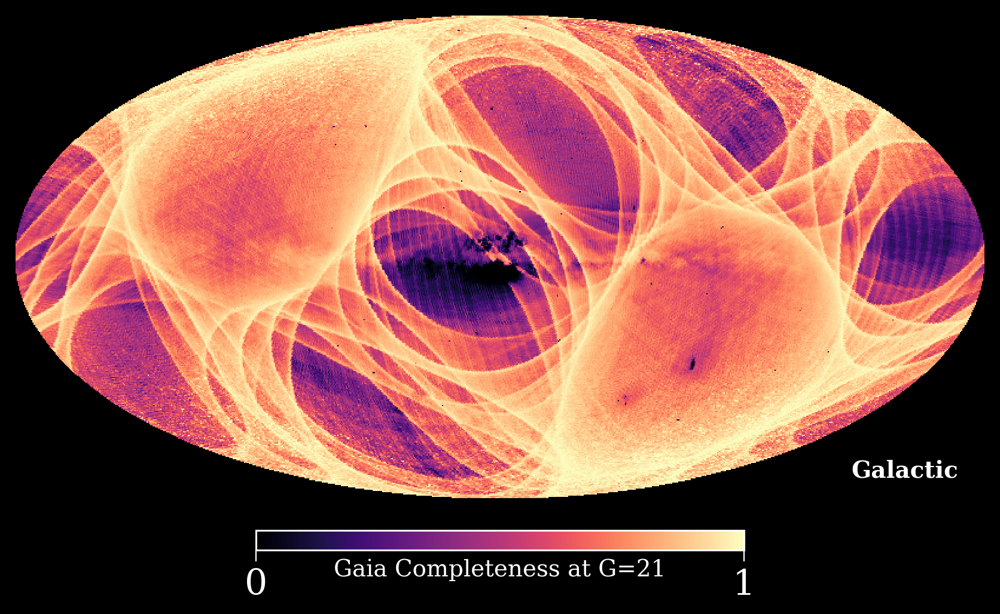

In [328]:
hp.mollview(completeness,coord=['Celestial','Galactic'], cmap="magma", bgcolor="black",
            min=0.0, unit="Gaia Completeness at G=21", title=None)

In [365]:
g = cogsworth.galaxy.Frankel2018(size=250000)

In [362]:
def plot(self, coordinates="cartesian", component=None, colour_by=None, show=True, cbar_norm=LogNorm(),
             cbar_label=r"Metallicity, $Z$", cmap="plasma", xlim=None, ylim=None, zlim=None, **kwargs):
    fig, axes = plt.subplots(2, 1, figsize=(10 * 1.2475, 14), gridspec_kw={'height_ratios': [4, 14]},
                             sharex=True)
    if colour_by is None:
        colour_by = self.Z.value

    if coordinates == "cylindrical":
        x = self.rho
        y1 = self.z
        y2 = self.phi
    elif coordinates == "cartesian":
        x = self.x
        y1 = self.z
        y2 = self.y
        axes[1].set_aspect("equal")
    else:
        raise ValueError("Invalid coordinates specified")

    if component is not None:
        mask = self._which_comp == component
        x = x[mask]
        y1 = y1[mask]
        y2 = y2[mask]
        colour_by = colour_by[mask]

    fig.subplots_adjust(hspace=0)

    axes[0].scatter(x, y1, c=colour_by, s=0.1, cmap=cmap, norm=cbar_norm, **kwargs)

    axes[0].set_xlabel(r"$x$ [kpc]", labelpad=15)
    axes[0].xaxis.tick_top()
    axes[0].xaxis.set_label_position("top")

    axes[0].set_ylabel(r"$z$ [kpc]")

    scatt = axes[1].scatter(x.value, y2.value, c=colour_by, s=0.1, cmap=cmap, norm=cbar_norm, **kwargs)
    cbar = fig.colorbar(scatt, ax=axes, pad=0.0)
    cbar.set_label(cbar_label)

    axes[1].set_xlabel(r"$x$ [kpc]")
    axes[1].set_ylabel(r"$y$ [kpc]")
    
    if xlim is not None:
        axes[0].set_xlim(xlim)
        axes[1].set_xlim(xlim)
    if ylim is not None:
        axes[1].set_ylim(ylim)
    if zlim is not None:
        axes[0].set_ylim(zlim)

    if show:
        plt.show()

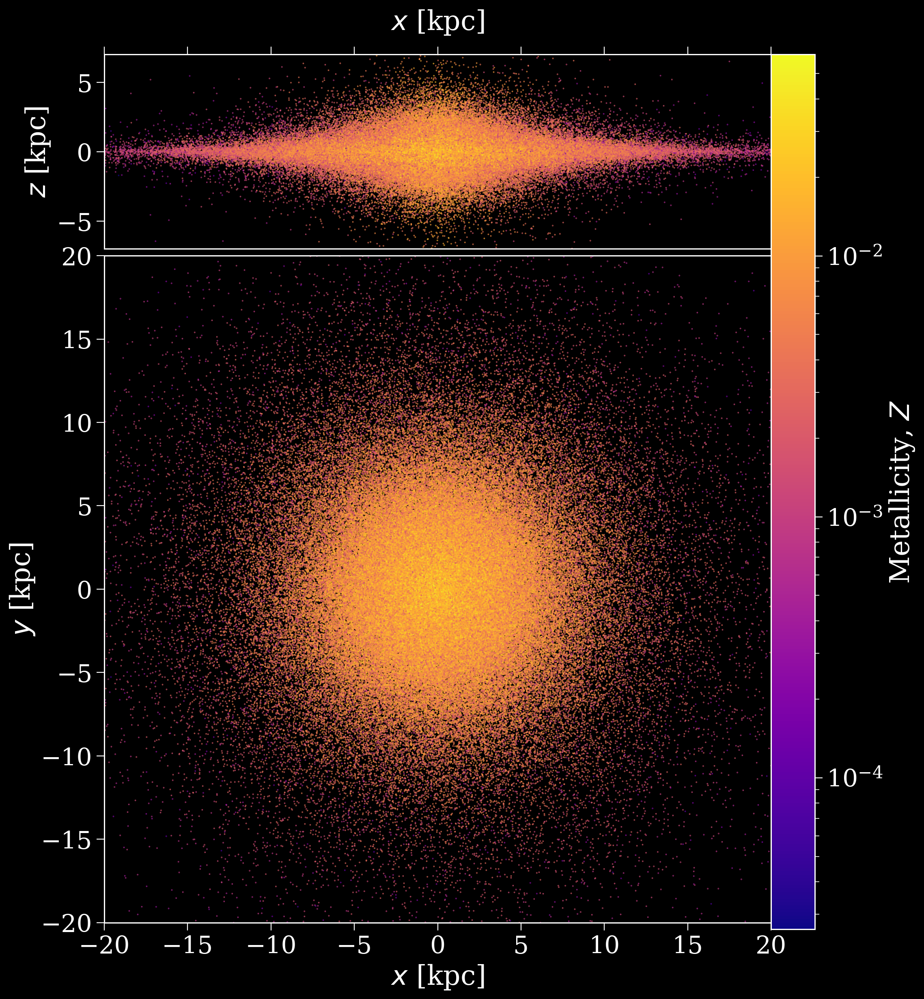

In [369]:
plot(g, xlim=(-20, 20), ylim=(-20, 20), zlim=(-7, 7))

In [338]:

from dustmaps.bayestar import BayestarQuery
l0, b0 = (37., -16.)
l = np.arange(l0 - 7., l0 + 7., 0.005)
b = np.arange(b0 - 7., b0 + 7., 0.005)
l, b = np.meshgrid(l, b)
coords = SkyCoord(l*u.deg, b*u.deg,
                  distance=1.*u.kpc, frame='galactic')

bayestar = BayestarQuery(max_samples=1)
Av_bayestar = 2.742 * bayestar(coords)

Loading pixel_info ...
Loading samples ...
Loading best_fit ...
Replacing NaNs in reliable distance estimates ...
Sorting pixel_info ...
Extracting hp_idx_sorted and data_idx at each nside ...
  nside = 64
  nside = 128
  nside = 256
  nside = 512
  nside = 1024
t = 13.476 s
  pix_info:   0.340 s
   samples:   3.115 s
      best:   3.157 s
       nan:   0.016 s
      sort:   6.789 s
       idx:   0.059 s


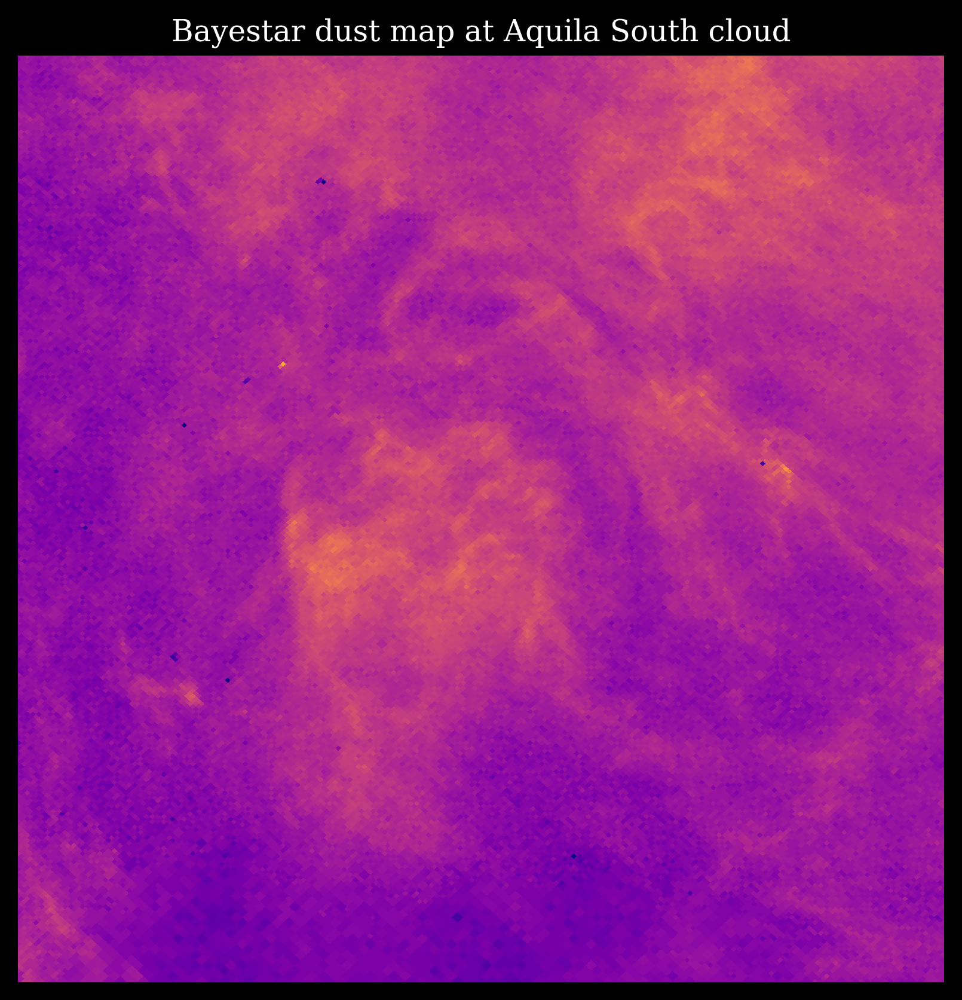

In [352]:
fig = plt.figure(figsize=(20,20), dpi=150)

for k,(Av,title) in enumerate([(Av_bayestar, 'Bayestar dust map at Aquila South cloud')]):
    ax = fig.add_subplot(1,3,k+1)
    im = ax.imshow(
        np.sqrt(Av)[::,::-1],
        vmin=0.,
        vmax=2.,
        origin='lower',
        interpolation='nearest',
        cmap='plasma',
        aspect='equal'
    )
    
    ax.axis('off')
    ax.set_title(title)
    # ax.tick_params(which="both", labelsize=0.5*fs)

fig.subplots_adjust(wspace=0., hspace=0.)

In [11]:
primary_observed, secondary_observed = p_bin.get_gaia_observed_bin_nums()

In [15]:
p_bin.classes.sum()

dco                     164
co-1                   6453
co-2                   4570
xrb                     104
walkaway-t-1              0
walkaway-t-2            329
runaway-t-1               0
runaway-t-2             944
walkaway-o-1              0
walkaway-o-2              1
runaway-o-1               0
runaway-o-2            1272
widow-1                   0
widow-2                1377
stellar-merger-co-1    2096
stellar-merger-co-2    3376
pisn-1                   17
pisn-2                    5
dtype: int64

In [21]:
((1.65 * u.Msun / u.yr) * (200 * u.Myr) / (p_bin.mass_binaries * u.Msun)).decompose()

<Quantity 182.10686427>

In [16]:
p_sing.classes.sum()

dco                      0
co-1                     0
co-2                     0
xrb                      0
walkaway-t-1             0
walkaway-t-2             0
runaway-t-1              0
runaway-t-2              0
walkaway-o-1             0
walkaway-o-2             0
runaway-o-1              0
runaway-o-2              0
widow-1                  0
widow-2                  0
stellar-merger-co-1    282
stellar-merger-co-2      0
pisn-1                   0
pisn-2                   0
dtype: int64

In [ ]:
primary_observed

/home/tomwagg/anaconda3/envs/cosmic-gala/lib/python3.10/site-packages/astropy/units/quantity.py:611: RuntimeWarning: invalid value encountered in rxp
  result = super().__array_ufunc__(function, method, *arrays, **kwargs)


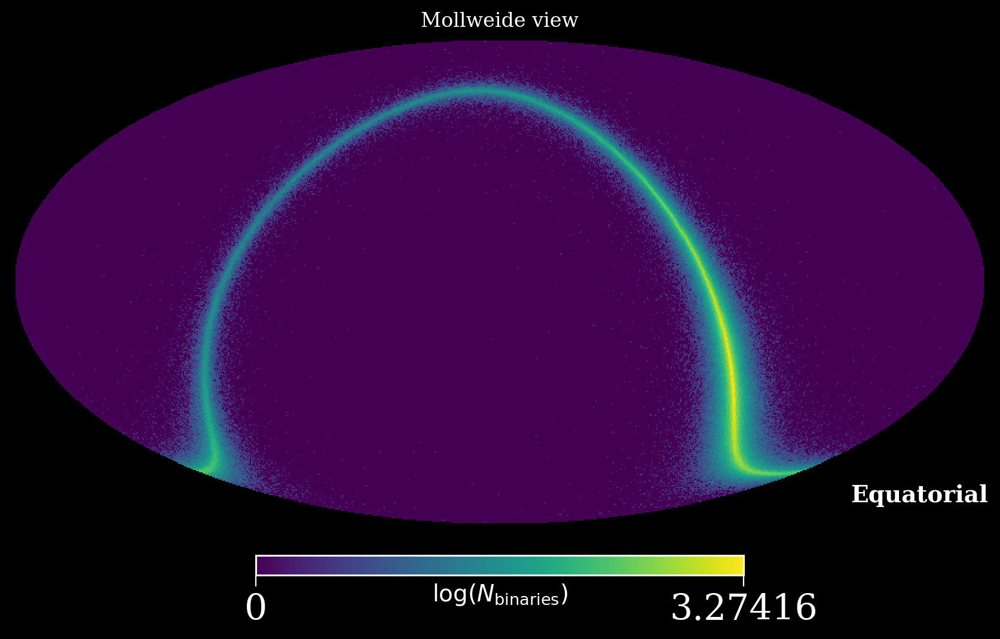

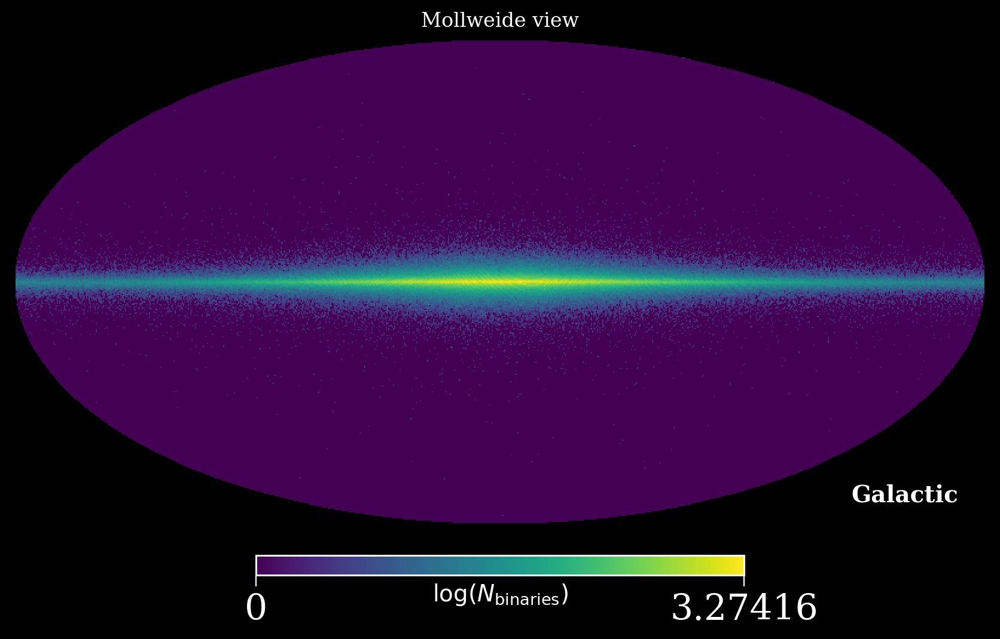

In [7]:
p_bin.plot_map(bgcolor="black", cmap="viridis")
p_bin.plot_map(bgcolor="black", cmap="viridis", coord="G")

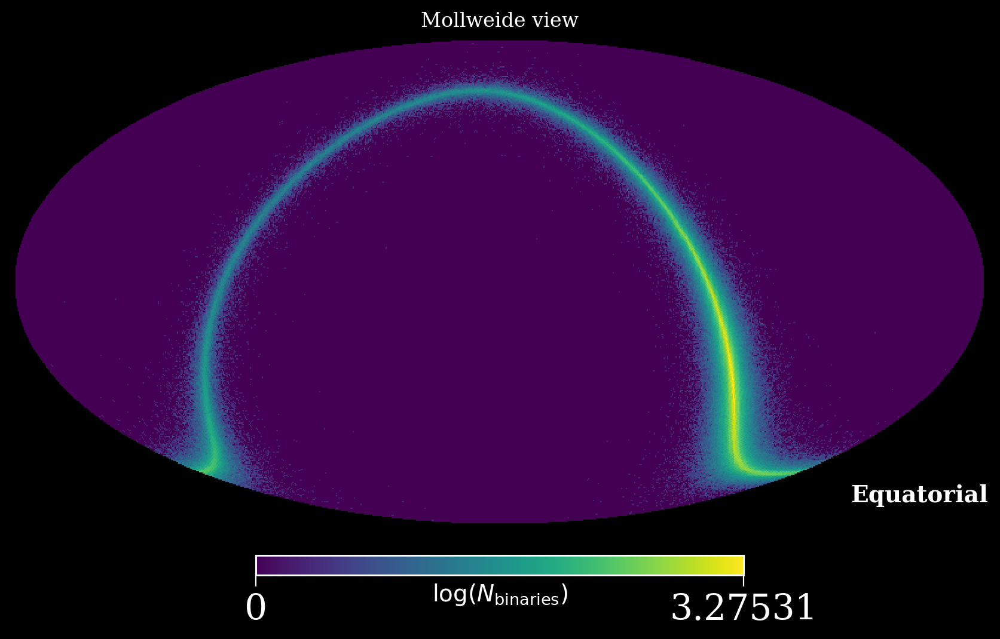

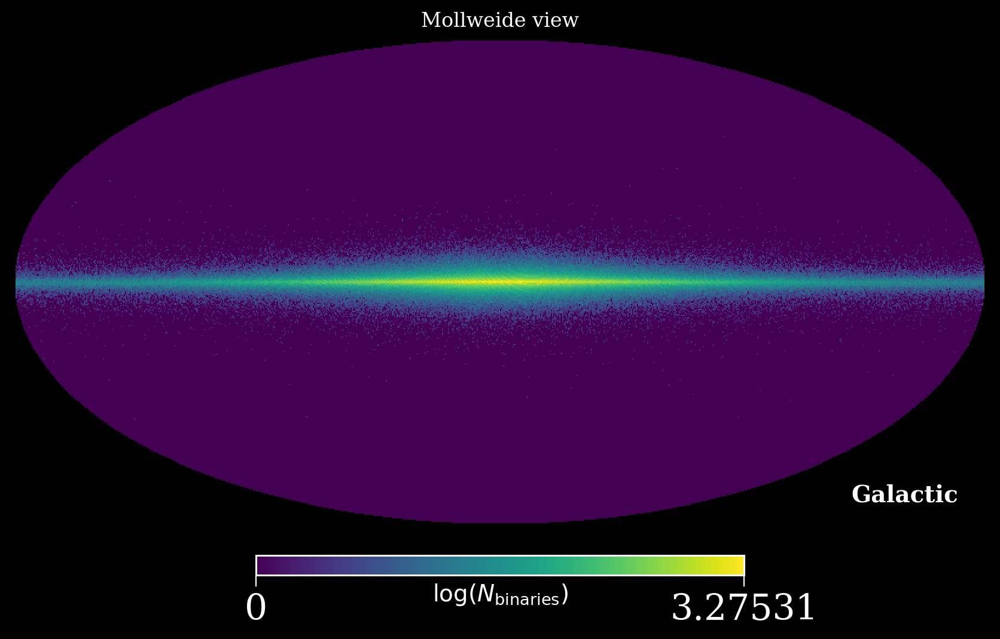

In [8]:
p_sing.plot_map(bgcolor="black", cmap="viridis")
p_sing.plot_map(bgcolor="black", cmap="viridis", coord="G")

# Old grid plots

In [122]:
def grid_plot(p, x_var, y_var, x_label, y_label):
    fig, axes = plt.subplots(2, 2, figsize=(20, 20), gridspec_kw={"width_ratios": [3, 1], "height_ratios": [1, 3]})

    fig.subplots_adjust(hspace=0.0, wspace=0.0)
    
    final_binaries = p.final_bpp
    
    kicked = final_binaries["bin_num"].isin(p.bpp[p.bpp["evol_type"].isin([15, 16])]["bin_num"])

    axes[1, 0].scatter(np.abs(final_binaries[f"{x_var}_1"][~kicked]), np.abs(final_binaries[f"{y_var}_1"][~kicked]), s=5, label=f"No supernova ({len(final_binaries[~kicked])})", zorder=10)

    axes[1, 0].scatter(np.abs(final_binaries[f"{x_var}_1"][kicked]), np.abs(final_binaries[f"{y_var}_1"][kicked]), s=10, color="C1", label=f"At least 1 supernova ({len(final_binaries[kicked])})")
    axes[1, 0].scatter(np.abs(final_binaries[f"{x_var}_2"][kicked & p.disrupted]), np.abs(final_binaries[f"{y_var}_2"][kicked & p.disrupted]), s=5, color="C1")

    axes[1, 0].set_xscale("log")
    axes[1, 0].set_yscale("log")

    axes[1, 0].set_xlabel(x_label)
    axes[1, 0].set_ylabel(y_label)

    axes[1, 0].legend(fontsize=0.7*fs, markerscale=5, handletextpad=0.0)

    axes[0, 1].axis("off")

    x_bins = np.logspace(np.log10(np.abs(final_binaries[f"{x_var}_1"]).min()), np.log10(np.abs(final_binaries[f"{x_var}_1"]).max()), 50)
    axes[0, 0].hist(np.abs(final_binaries[f"{x_var}_1"][~kicked]), bins=x_bins, log=True)
    axes[0, 0].hist(np.abs(np.concatenate((final_binaries[f"{x_var}_1"][kicked], final_binaries[f"{x_var}_2"][kicked]))), bins=x_bins, log=True, alpha=0.5)
    axes[0, 0].set_xscale("log")
    axes[0, 0].set_xticks([])
    axes[0, 0].set_ylabel(r"$N_{\rm binary}$")

    y_bins = np.logspace(np.log10(np.abs(final_binaries[f"{y_var}_1"]).min()), np.log10(np.abs(final_binaries[f"{y_var}_1"]).max()), 50)
    axes[1, 1].hist(np.abs(final_binaries[f"{y_var}_1"][~kicked]), bins=y_bins, orientation="horizontal", log=True)
    axes[1, 1].hist(np.abs(np.concatenate((final_binaries[f"{y_var}_1"][kicked], final_binaries[f"{y_var}_2"][kicked]))), bins=y_bins, orientation="horizontal", log=True, alpha=0.5)
    axes[1, 1].set_yscale("log")
    axes[1, 1].set_yticks([])
    axes[1, 1].set_xlabel(r"$N_{\rm binary}$")

    plt.show()

In [123]:
p_bin.final_coords[0].v_x

<Quantity [-129.75506488,   19.47628211, -166.29029251, ...,  -24.23732024,
           -127.87212206,  191.37807988] km / s>

In [127]:
for ind in [1, 2]:
    p_bin.final_bpp[f"dist_{ind}"] = np.sqrt(p_bin.final_coords[ind - 1].x**2
                                             + p_bin.final_coords[ind - 1].y**2
                                             + p_bin.final_coords[ind - 1].z**2).to(u.pc).value
    p_bin.final_bpp[f"speed_{ind}"] = np.sqrt(p_bin.final_coords[ind - 1].v_x**2
                                             + p_bin.final_coords[ind - 1].v_y**2
                                             + p_bin.final_coords[ind - 1].v_z**2).value
    p_bin.final_bpp[f"rho_{ind}"] = p_bin.final_coords[ind - 1].galactocentric.represent_as("cylindrical").rho.to(u.pc).value
    p_bin.final_bpp[f"v_z_{ind}"] = p_bin.final_coords[ind - 1].v_z.to(u.km / u.s).value

/tmp/ipykernel_1071725/2047394946.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  p_bin.final_bpp[f"dist_{ind}"] = np.sqrt(p_bin.final_coords[ind - 1].x**2
/tmp/ipykernel_1071725/2047394946.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  p_bin.final_bpp[f"speed_{ind}"] = np.sqrt(p_bin.final_coords[ind - 1].v_x**2
/tmp/ipykernel_1071725/2047394946.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead



In [125]:
p_bin.final_bpp

,tphys,mass_1,mass_2,kstar_1,kstar_2,sep,porb,ecc,RRLO_1,RRLO_2,evol_type,aj_1,aj_2,tms_1,tms_2,massc_1,massc_2,rad_1,rad_2,mass0_1,mass0_2,lum_1,lum_2,teff_1,teff_2,radc_1,radc_2,menv_1,menv_2,renv_1,renv_2,omega_spin_1,omega_spin_2,B_1,B_2,bacc_1,bacc_2,tacc_1,tacc_2,epoch_1,epoch_2,bhspin_1,bhspin_2,bin_num,metallicity,log_g_1,log_g_2,dist_1,speed_1,dist_2,speed_2,rho_1,v_z1,rho_2,v_z2
0,5.285176,0.504445,0.481971,0.0,0.0,15.882160,7.385953,0.018872,0.077654,0.075875,10.0,5.285176,5.285176,1.342908e+05,1.503138e+05,0.0,0.0,0.463290,0.443347,0.504445,0.481971,0.036855,0.032731,3732.210828,3703.709585,0.0,0.0,1.468149e-01,1.647629e-01,1.815558e-01,1.821667e-01,6.177084,4.517923,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0,0.023117,4.809175,4.827602,5857.944629,236.077589,inf,inf,5854.308557,-16.690232,inf,inf
1,197.346181,0.291554,0.146654,0.0,0.0,2280.808886,19070.655251,0.889551,0.002638,0.002186,10.0,197.346181,197.346181,3.900430e+05,1.556076e+06,0.0,0.0,0.292035,0.176932,0.291554,0.146654,0.013676,0.003215,3668.923717,3282.197065,0.0,0.0,2.915539e-01,7.332680e-02,2.920346e-01,1.150059e-01,0.133951,0.001018,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,1,0.005585,4.971918,5.108747,14183.652783,218.761379,inf,inf,14183.333665,3.297908,inf,inf
2,146.472372,0.317983,0.197383,0.0,0.0,3303.967677,30659.719433,0.009396,0.000235,0.000214,10.0,146.472372,146.472372,3.768730e+05,9.829632e+05,0.0,0.0,0.323900,0.237063,0.317983,0.197383,0.013380,0.005072,3464.794257,3177.869605,0.0,0.0,3.179829e-01,9.869132e-02,3.238999e-01,1.540909e-01,0.238268,0.007782,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,2,0.030000,4.919650,4.983649,2242.429798,182.479819,inf,inf,2196.080412,1.722074,inf,inf
3,118.488409,0.562461,0.433245,0.0,0.0,253.912398,469.929306,0.561542,0.011591,0.010023,10.0,118.488409,118.488409,8.110493e+04,1.683163e+05,0.0,0.0,0.518365,0.397884,0.562461,0.433245,0.065480,0.029037,4073.612786,3794.292390,0.0,0.0,1.124787e-01,2.163085e-01,1.885578e-01,1.953829e-01,12.941394,2.185034,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,3,0.007084,4.758889,4.875288,12215.599064,227.402912,inf,inf,12213.575396,-9.419409,inf,inf
4,139.173659,0.113112,0.103054,0.0,0.0,75.099401,162.230543,0.013694,0.004921,0.005041,10.0,139.173659,139.173659,2.675758e+06,3.223463e+06,0.0,0.0,0.141074,0.138482,0.113112,0.103054,0.001468,0.001082,3021.446301,2825.492333,0.0,0.0,5.655620e-02,5.152708e-02,9.169779e-02,9.001347e-02,0.000167,0.000082,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,4,0.006762,5.192687,5.168345,12524.991897,225.941141,inf,inf,12505.329929,-15.613304,inf,inf
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1323126,172.565110,0.201396,0.151813,0.0,0.0,6.387609,3.148210,0.002696,0.088497,0.081551,10.0,172.565110,172.565110,8.549897e+05,1.505286e+06,0.0,0.0,0.227538,0.184286,0.201396,0.151813,0.006435,0.003316,3442.601676,3241.087082,0.0,0.0,2.013959e-01,7.590664e-02,2.275376e-01,1.197862e-01,0.009491,0.001282,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,1323126,0.007687,5.028012,5.088391,12359.724491,223.177230,inf,inf,12359.546415,1.546425,inf,inf
1323127,199.798014,0.364924,0.203771,0.0,0.0,59.008013,69.662496,0.321558,0.019996,0.017309,10.0,199.798014,199.798014,2.467991e+05,8.190399e+05,0.0,0.0,0.344353,0.228505,0.364924,0.203771,0.020266,0.006810,3727.854805,3484.227235,0.0,0.0,3.317121e-01,2.037705e-01,3.020580e-01,2.285045e-01,0.658631,0.010360,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,1323127,0.006400,4.926264,5.029419,13059.576595,221.987882,inf,inf,13059.545952,-12.033163,inf,inf
1323128,54.658734,0.134890,0.120864,0.0,0.0,528.139926,2781.536250,0.506014,0.001759,0.001684,10.0,54.658734,54.658734,2.102925e+06,2.619175e+06,0.0,0.0,0.178312,0.162291,0.134890,0.120864,0.002226,0.001762,2982.209294,2948.592173,0.0,0.0,6.744

In [56]:
from dustmaps.sfd import SFDQuery

In [60]:
sfd = SFDQuery()
sfd_av1 = sfd.query(p_bin.final_coords[0]) * 2.742

In [78]:
sfd_low_dec = sfd.query(p_bin.final_coords[0][p_bin.final_coords[0].icrs.dec <= -30 * u.deg]) * 2.742

In [95]:
p_sing.kick_info.loc[501]

,star,disrupted,natal_kick,phi,theta,mean_anomaly,delta_vsysx_1,delta_vsysy_1,delta_vsysz_1,vsys_1_total,delta_vsysx_2,delta_vsysy_2,delta_vsysz_2,vsys_2_total,delta_theta_total,omega,randomseed,bin_num
501,1.0,0.0,707.999435,26.756445,20.47344,0.0,-202.456195,28.372324,-677.841943,707.999435,0.0,0.0,-0.0,0.0,0.0,0.0,-706456419.0,501.0
501,0.0,0.0,0.000000,0.000000,0.00000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,501.0


In [120]:
experienced_supernova = p_bin.final_bpp["bin_num"].isin(p_bin.bpp[p_bin.bpp["evol_type"].isin([15, 16])]["bin_num"].unique())

In [121]:
experienced_supernova.loc[159]

True

In [101]:
p_bin.classes.loc[159]

dco                    False
co-1                    True
co-2                   False
xrb                    False
walkaway-t-1           False
walkaway-t-2            True
runaway-t-1            False
runaway-t-2            False
walkaway-o-1           False
walkaway-o-2           False
runaway-o-1            False
runaway-o-2             True
widow-1                False
widow-2                 True
stellar-merger-co-1    False
stellar-merger-co-2    False
pisn-1                 False
pisn-2                 False
Name: 159, dtype: bool

In [99]:
p_bin.kick_info.loc[159]

,star,disrupted,natal_kick,phi,theta,mean_anomaly,delta_vsysx_1,delta_vsysy_1,delta_vsysz_1,vsys_1_total,delta_vsysx_2,delta_vsysy_2,delta_vsysz_2,vsys_2_total,delta_theta_total,omega,randomseed,bin_num
159,1.0,1.0,418.315949,-11.991045,145.439125,0.0,-44.220169,-194.733453,-366.670822,417.521296,-3.904866,-10.69813,19.233691,22.352468,0.0,0.0,-1.525976e+09,159.0
159,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.0,0.0,0.000000e+00,159.0


In [97]:
p_bin.final_bpp[p_bin.disrupted]

,tphys,mass_1,mass_2,kstar_1,kstar_2,sep,porb,ecc,RRLO_1,RRLO_2,evol_type,aj_1,aj_2,tms_1,tms_2,massc_1,massc_2,rad_1,rad_2,mass0_1,mass0_2,lum_1,lum_2,teff_1,teff_2,radc_1,radc_2,menv_1,menv_2,renv_1,renv_2,omega_spin_1,omega_spin_2,B_1,B_2,bacc_1,bacc_2,tacc_1,tacc_2,epoch_1,epoch_2,bhspin_1,bhspin_2,bin_num,metallicity,log_g_1,log_g_2,dist_1,speed_1,dist_2,speed_2
159,76.341072,1.277584,5.338471,13.0,1.0,-1.0,-1.0,-1.0,0.0001,0.0001,10.0,30.611119,76.427018,1.000000e+10,8.672424e+01,1.277584,0.000000,0.000014,4.855349,7.727594,5.338471,2.515084e-05,1.506490e+03,109734.627979,16392.715995,0.000014,0.000000,1.000000e-10,1.000000e-10,1.000000e-10,1.000000e-10,2.136056e+08,1.286493e+03,6.864957e+11,0.000000e+00,0.0,0.0,0.0,0.0,45.729953,-0.085946,0.0,0.0,159,0.004999,14.252201,3.793044,23506.019971,609.234511,14002.344783,250.233759
824,156.923669,1.654391,3.353436,13.0,14.0,-1.0,-1.0,-1.0,0.0001,0.0001,10.0,149.812059,147.783712,1.000000e+10,1.000000e+10,1.654391,3.353436,0.000014,0.000014,4.876241,8.113114,1.248602e-06,1.000000e-10,51797.835534,4862.299115,0.000014,0.000014,1.000000e-10,1.000000e-10,1.000000e-10,1.000000e-10,1.330270e+08,2.000000e+08,5.684291e+11,0.000000e+00,0.0,0.0,0.0,0.0,7.111610,9.139956,0.0,0.0,824,0.030000,14.364450,14.657846,20399.423162,63.814737,15461.233274,121.895602
1198,105.880663,3.627144,4.019487,14.0,14.0,-1.0,-1.0,-1.0,0.0001,0.0001,10.0,101.734744,99.084959,1.000000e+10,1.000000e+10,3.627144,4.019487,0.000015,0.000017,8.334462,8.737701,1.000000e-10,1.000000e-10,4675.244111,4441.210719,0.000015,0.000017,1.000000e-10,1.000000e-10,1.000000e-10,1.000000e-10,2.000000e+08,2.000000e+08,0.000000e+00,0.000000e+00,0.0,0.0,0.0,0.0,4.145919,6.795704,0.0,0.0,1198,0.028836,14.623771,14.579165,4502.107523,209.438508,14672.340348,98.630776
1367,199.810093,1.277584,2.917150,13.0,13.0,-1.0,-1.0,-1.0,0.0001,0.0001,10.0,178.032191,174.513269,1.000000e+10,1.000000e+10,1.277584,2.917150,0.000014,0.000014,2.314113,18.349009,7.435561e-07,1.345536e-06,45502.371548,52775.146834,0.000014,0.000014,1.000000e-10,1.000000e-10,1.000000e-10,1.000000e-10,3.587039e+07,6.297010e+06,1.946829e+12,1.113991e+13,0.0,0.0,0.0,0.0,21.777901,25.296823,0.0,0.0,1367,0.013812,14.252201,14.610770,99676.120197,466.095640,32362.824923,84.744613
1542,71.712462,1.277584,1.277584,13.0,13.0,-1.0,-1.0,-1.0,0.0001,0.0001,10.0,47.363649,42.483881,1.000000e+10,1.000000e+10,1.277584,1.277584,0.000014,0.000014,10.447991,9.504090,1.050559e-05,1.305757e-05,88218.713963,93147.501167,0.000014,0.000014,1.000000e-10,1.000000e-10,1.000000e-10,1.000000e-10,2.780264e+06,5.869071e+07,5.039486e+13,2.459828e+12,0.0,0.0,0.0,0.0,24.348813,29.228581,0.0,0.0,1542,0.015090,14.252201,14.252201,16844.468040,220.685966,9072.239087,335.048269
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1320798,177.506372,1.617079,2.798988,13.0,13.0,-1.0,-1.0,-1.0,0.0001,0.0001,10.0,170.279004,166.699597,1.000000e+10,1.000000e+10,1.617079,2.798988,0.000014,0.000014,4.756016,7.447395,9.518264e-07,1.434338e-06,48399.963041,53625.146823,0.000014,0.000014,1.000000e-10,1.000000e-10,1.000000e-10,1.000000e-10,3.151820e+07,7.741965e+07,2.250234e+12,9.150563e+11,0.0,0.0,0.0,0.0,7.227368,10.806774,0.0,0.0,1320798,0.030000,14.354543,14.592813,29313.340584,53.574986,135260.466139,741.762638
1320983,77.964624,1.845941,9.355601,13.0,14.0,-1.0,-1.0,-1.0,0.0001,0.0001,10.0,65.209917,59.434606,1.000000e+10,1.000000e+10,1.845941,9.355601,0.000014,0.000040,5.265165,23.335937,7.091999e-06,1.000000e-10,79964.596835,2911.057853,0.000014,0.000040,1.000000e-10,1.000000e-10,1.000000e-10,1.000000e-10,1.310626e+08,2.000000e+08,8.911449e+11,0.000000e+00,0.0,0.0,0.0,0.0,12.754706,18.530017,0.0,0.0,1320983,0.003793,14.412029,14.212264,25958.154034,265.913411,25873.065204,329.192501
1321827,40.933953,1.277584,5.787350,13.0,1.0,-1.0,-1.0,-1.0,0.0001,0.0001,10

In [90]:
p_sing.kick_info.loc[501]

,star,disrupted,natal_kick,phi,theta,mean_anomaly,delta_vsysx_1,delta_vsysy_1,delta_vsysz_1,vsys_1_total,delta_vsysx_2,delta_vsysy_2,delta_vsysz_2,vsys_2_total,delta_theta_total,omega,randomseed,bin_num
501,1.0,0.0,707.999435,26.756445,20.47344,0.0,-202.456195,28.372324,-677.841943,707.999435,0.0,0.0,-0.0,0.0,0.0,0.0,-706456419.0,501.0
501,0.0,0.0,0.000000,0.000000,0.00000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,501.0


In [86]:
len(sfd_low_dec[sfd_low_dec < 6]) / len(sfd_low_dec)

0.2583662336276576

In [68]:
av1_ratio = sfd_av1 / p_bin.observables["Av_1"]

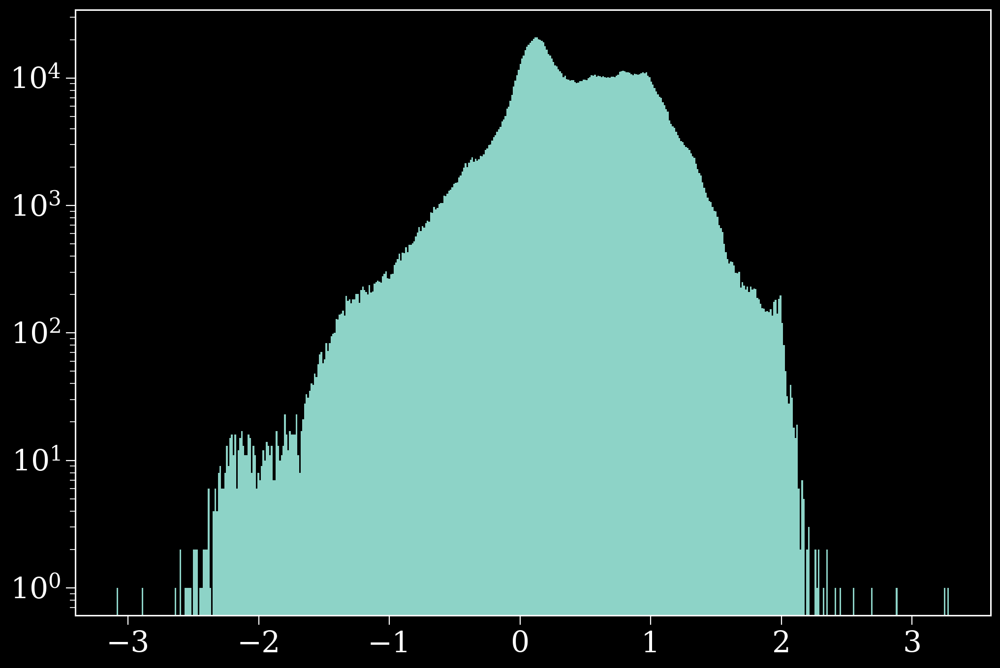

In [72]:
plt.hist(np.log10(av1_ratio[np.isfinite(av1_ratio)]), bins="fd", log=True)
plt.show()

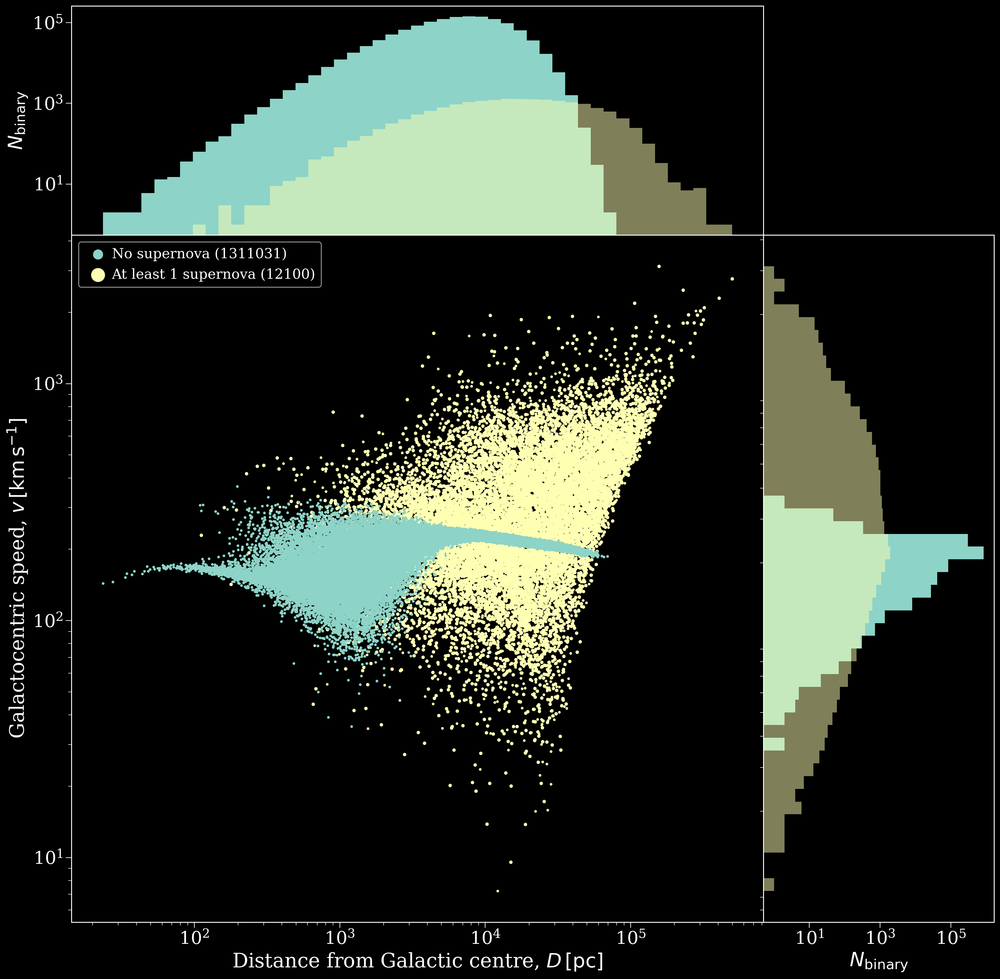

In [54]:
grid_plot(p_bin, "dist", "speed", r"Distance from Galactic centre, $D\,[\rm pc]$", r"Galactocentric speed, $v\,[\rm km \, s^{-1}]$")

In [145]:
no_dustmap = (p_bin.final_coords[0].icrs.dec < -30 * u.deg)

In [148]:
p_bin.final_coords[0].galactic.b[no_dustmap]

<Latitude [-0.15166163,  2.237975  ,  0.04216097, ..., -2.17457424,
           -0.3985811 , -0.64399694] deg>

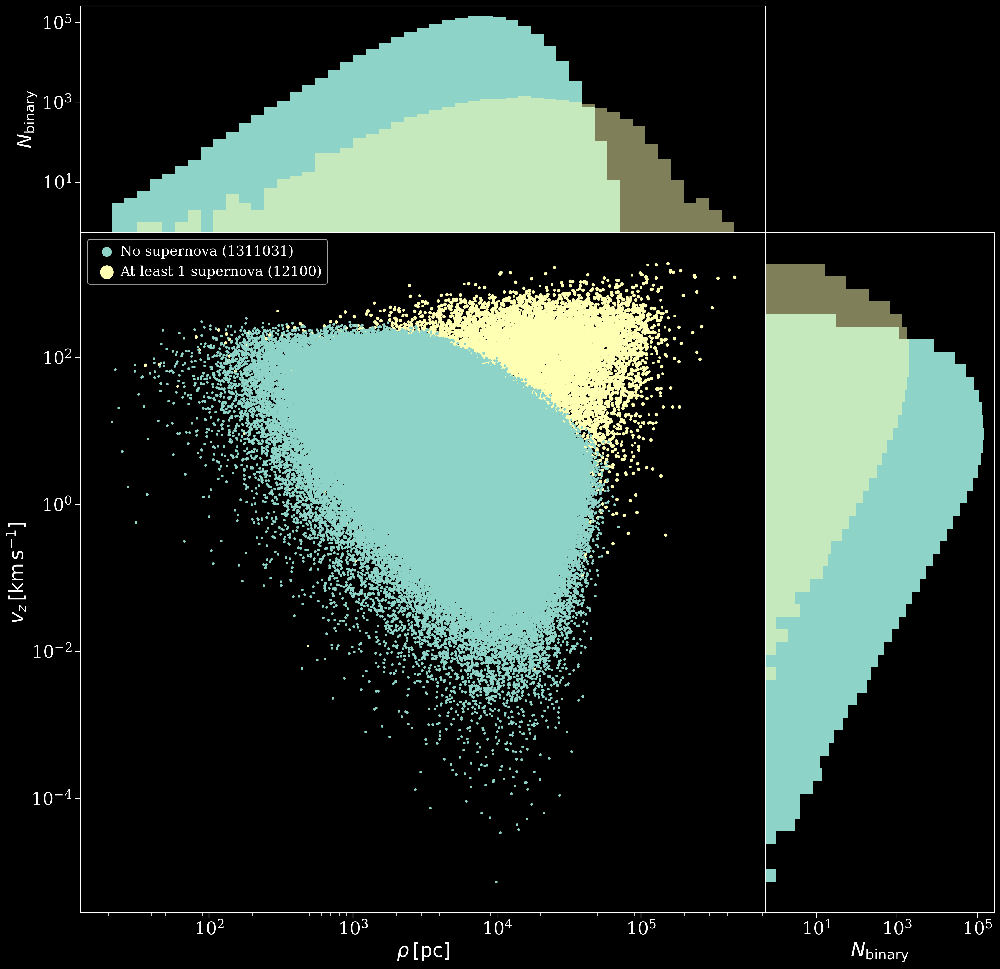

In [129]:
grid_plot(p_bin, "rho", "v_z", r"$\rho\,[\rm pc]$", r"$v_z\,[\rm km \, s^{-1}]$")

In [135]:
from importlib import reload

In [136]:
reload(cogsworth)

<module 'cogsworth' from '/home/tomwagg/Documents/cosmic-gala/cogsworth/__init__.py'>

In [137]:
class RecentHistory(cogsworth.galaxy.Frankel2018):
    def __init__(self, components=["low_alpha_disc"], component_masses=[1], **kwargs):
        super().__init__(components=components, component_masses=component_masses, **kwargs)

    def draw_lookback_times(self, size=None, component="low_alpha_disc"):
        if component != "low_alpha_disc":
            raise NotImplementedError()

        U = np.random.rand(size)
        norm = 1 / (self.tsfr * np.exp(-self.galaxy_age / self.tsfr) * (np.exp(200 * u.Myr / self.tsfr) - 1))
        tau = self.tsfr * np.log((U * np.exp(self.galaxy_age / self.tsfr)) / (norm * self.tsfr) + 1)

        return tau

In [138]:
g = RecentHistory(size=100000)

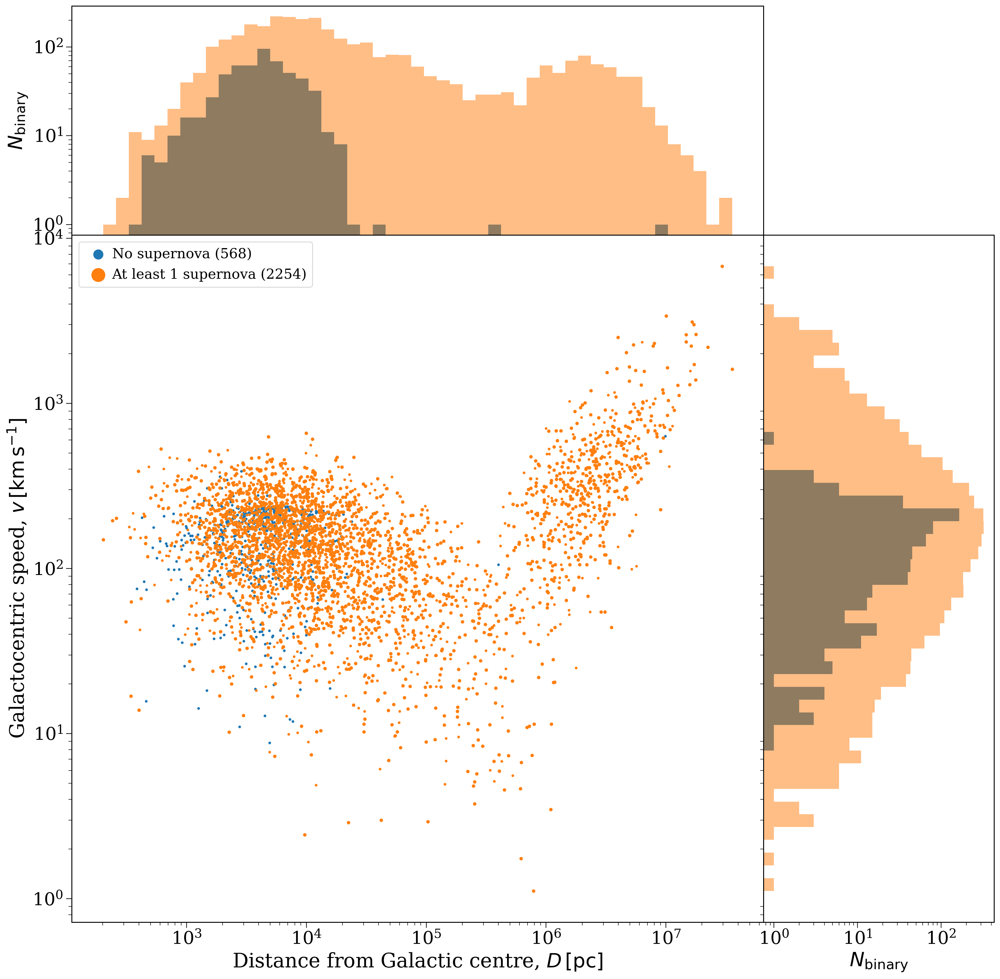

In [23]:
grid_plot("dist", "speed", r"Distance from Galactic centre, $D\,[\rm pc]$", r"Galactocentric speed, $v\,[\rm km \, s^{-1}]$")

In [20]:
def grid_plot_by_mass(x_var, y_var, x_label, y_label, mass_lims=[0.0, 0.1, 1.5, 7.0, 20, np.inf], sizes=[1, 1, 10, 10, 10]):
    fig, axes = plt.subplots(2, 2, figsize=(20, 20), gridspec_kw={"width_ratios": [3, 1], "height_ratios": [1, 3]})

    fig.subplots_adjust(hspace=0.0, wspace=0.0)

    disrupted = final_binaries["sep"] < 0

    x_bins = np.logspace(np.log10(np.abs(final_binaries[f"{x_var}_1"]).min()), np.log10(np.abs(final_binaries[f"{x_var}_1"]).max()), 50)
    y_bins = np.logspace(np.log10(np.abs(final_binaries[f"{y_var}_1"]).min()), np.log10(np.abs(final_binaries[f"{y_var}_1"]).max()), 50)
    for i in range(len(mass_lims) - 1):
        mass_mask = ((p.initial_binaries["mass_1"] >= mass_lims[i]) & (p.initial_binaries["mass_1"] < mass_lims[i + 1])).values
        label = f"{mass_lims[i]} " + r"$\leq m_{1, i} <$" + f" {mass_lims[i + 1]}   ({len(final_binaries[mass_mask])})"
        axes[1, 0].scatter(np.abs(final_binaries[f"{x_var}_1"][mass_mask]), np.abs(final_binaries[f"{y_var}_1"][mass_mask]), s=sizes[i], label=label)
        axes[0, 0].hist(np.abs(final_binaries[f"{x_var}_1"][mass_mask]), bins=x_bins, log=True, histtype="step")
        axes[1, 1].hist(np.abs(final_binaries[f"{y_var}_1"][mass_mask]), bins=y_bins, orientation="horizontal", log=True, histtype="step")

    axes[1, 0].set_xscale("log")
    axes[1, 0].set_yscale("log")

    axes[1, 0].set_xlabel(x_label)
    axes[1, 0].set_ylabel(y_label)

    axes[1, 0].legend(fontsize=0.7*fs, markerscale=5, handletextpad=0.0)

    axes[0, 1].axis("off")
    
    axes[0, 0].set_xscale("log")
    axes[0, 0].set_xticks([])
    axes[0, 0].set_ylabel(r"$N_{\rm binary}$")

    # axes[1, 1].hist(np.abs(final_binaries[f"{y_var}_1"][~kicked]), bins=y_bins, orientation="horizontal", log=True)
    # axes[1, 1].hist(np.abs(np.concatenate((final_binaries[f"{y_var}_1"][kicked], final_binaries[f"{y_var}_2"][kicked]))), bins=y_bins, orientation="horizontal", log=True, alpha=0.5)
    axes[1, 1].set_yscale("log")
    axes[1, 1].set_yticks([])
    axes[1, 1].set_xlabel(r"$N_{\rm binary}$")

    plt.show()

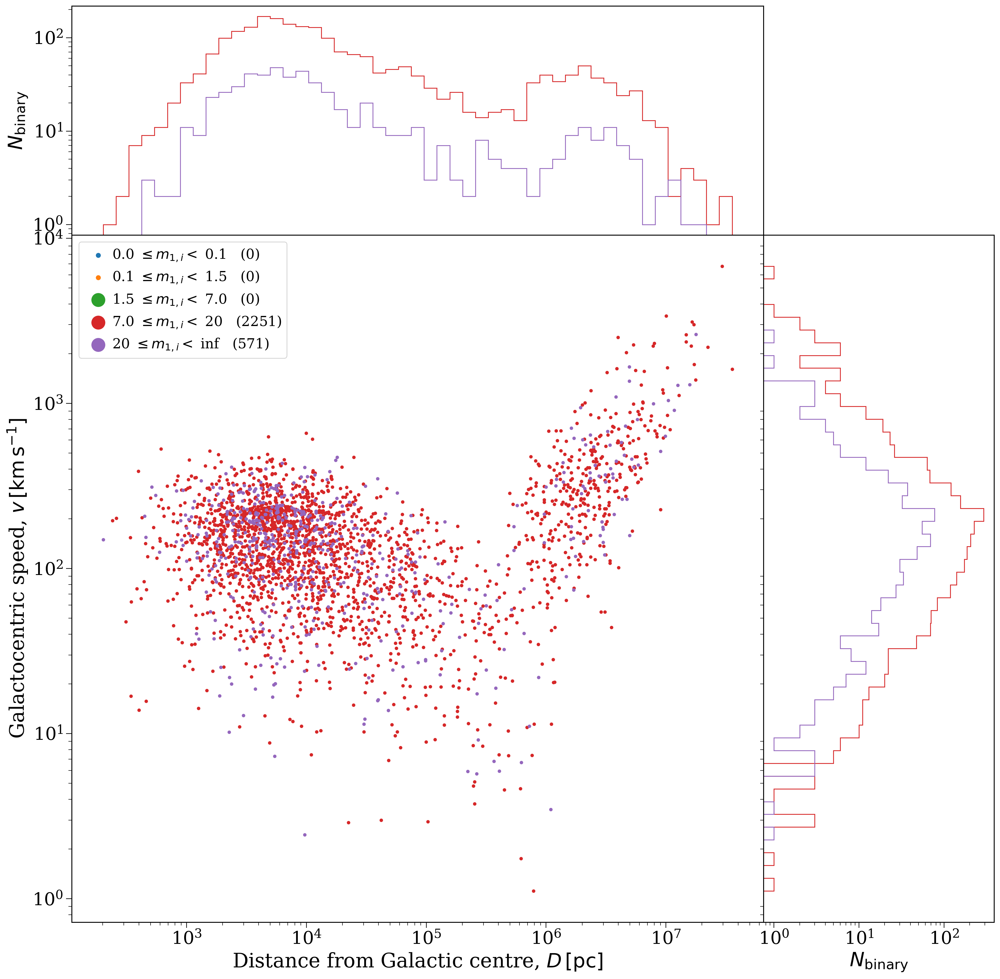

In [22]:
grid_plot_by_mass("dist", "speed", r"Distance from Galactic centre, $D\,[\rm pc]$", r"Galactocentric speed, $v\,[\rm km \, s^{-1}]$")

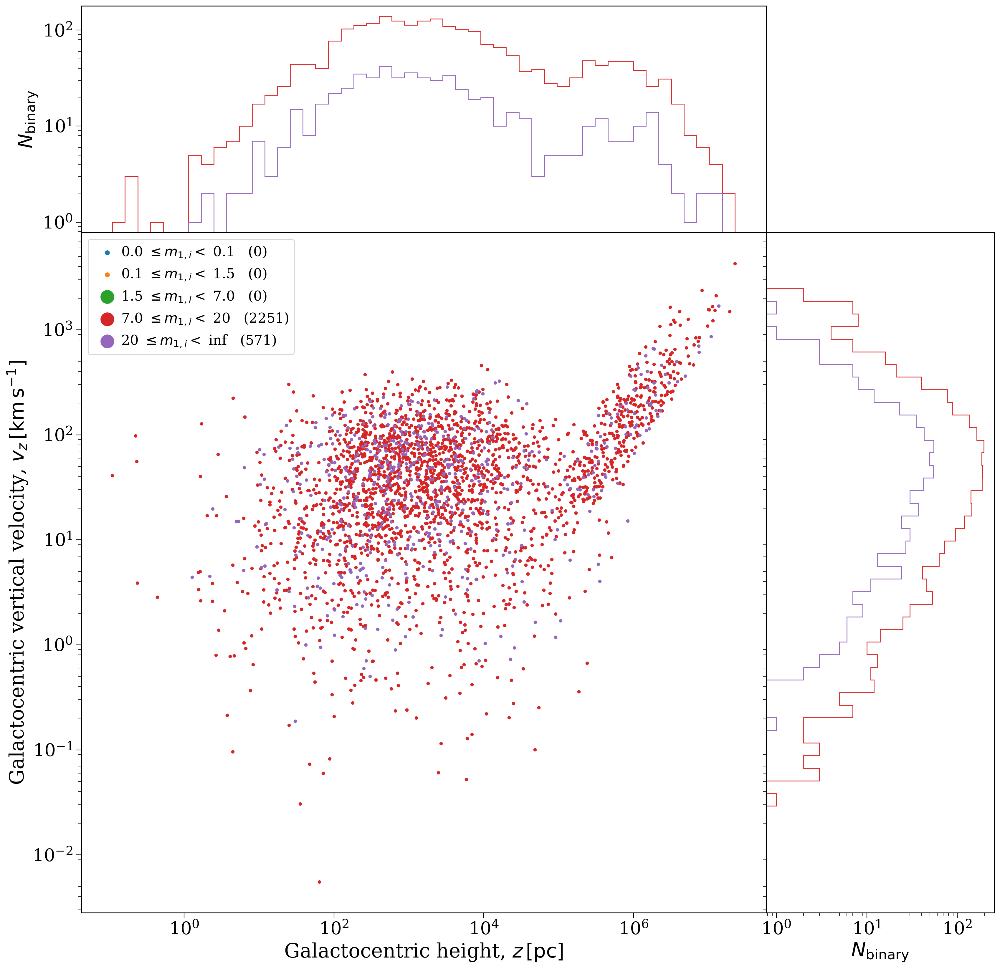

In [24]:
grid_plot_by_mass("z", "v_z", r"Galactocentric height, $z\,[\rm pc]$", r"Galactocentric vertical velocity, $v_z\,[\rm km \, s^{-1}]$")